### Figure 3: Why no escape?

* Example E-I traces over a burst (train)
* E/I ratio of successive pulses across freq and numSq
* Summary figure across cells

__Note: This figure should explain why we dont see escape from E-I balance__

<img src="notes_figures/Figure_updates_Fig5_24Jan2024.jpg" height="500"/>

In [1]:
import sys
import os
import importlib
from   pathlib      import Path
import traceback

import numpy                as np
import matplotlib           as mpl
import matplotlib.pyplot    as plt
import seaborn              as sns
import pandas               as pd

from scipy.signal   import find_peaks, peak_widths
from scipy.signal   import butter, bessel, decimate, sosfiltfilt
from scipy.stats    import kruskal, wilcoxon, mannwhitneyu, ranksums
# from scipy.signal   import filter_design
from scipy.optimize import curve_fit
from lmfit import Model, Parameters
from mpl_toolkits.axes_grid1 import make_axes_locatable

# from PIL            import Image

from eidynamics     import utils, plot_tools
# ephys_classes, , expt_to_dataframe, data_quality_checks
from eidynamics     import pattern_index
# from eidynamics     import abf_to_data
# from eidynamics     import fit_PSC
# from Findsim        import tab_presyn_patterns_LR_43
# import parse_data
import all_cells
rollvar_baseline = utils.mean_at_least_rolling_variance

sns.set_context('paper')
%matplotlib widget
%tb
# import plotly.express as px
# import plotly.graph_objects as go

# make a colour map viridis
viridis = mpl.colormaps["viridis"]
flare   = mpl.colormaps["flare"]
crest   = mpl.colormaps["crest"]
magma   = mpl.colormaps["magma"]
edge    = mpl.colormaps['edge']

color_E = flare
color_I = crest
color_freq = {1:magma(0.05), 5:magma(0.1), 10:magma(0.2), 20:magma(.4), 30:magma(.5), 40:magma(.6), 50:magma(.7), 100:magma(.9)}
color_squares = color_squares = {1:viridis(0.2), 5:viridis(.4), 7:viridis(.6), 15:viridis(.8), 20:viridis(1.0)}
color_EI = {-70:flare(0), 0:crest(0)}
color_cells = mpl.colormaps['tab10']
Fs = 2e4
patternIDs = np.arange(46,80)
freq_sweep_pulses = np.arange(9)

>> Working on:  C:\Users\adity\OneDrive\NCBS


No traceback available to show.


In [ ]:
# sns.set_context(context='notebook', font_scale=1.5,)
# custom_params = {"axes.spines.right": False, "axes.spines.top": False,"lines.linewidth": 3}
# sns.set_theme(style="ticks", rc=custom_params)

In [17]:
def calculate_expected_response(celldf, pulse_index, freq, patternID, mode='p0', scale_by_field=False):
    """
    Calculate the expected response of a pattern based on the response to individual spots in the pattern
    """
    from eidynamics import pattern_index
    Fs      = 2e4
    cellID  = celldf['cellID'].iloc[0]
    
    if celldf['numChannels'].iloc[0] == 3:
        scale_by_field = False
    

    # get the pattern
    constituent_spots_of_pattern    = pattern_index.get_patternIDlist_for_nSq_pattern(patternID)
    numSq                   = len(constituent_spots_of_pattern)
    # print(patternID, numSq, constituent_spots_of_pattern)

    # check if the given cell has 1sq data
    if not 1 in celldf['numSq'].unique():
        # print('No 1Sq data for this cell', celldf['numSq'].unique())
        # generate dataerror to be caught by the calling function
        raise ValueError('No 1Sq data for this cell')
        
    
    num_metadataframes = 28 #
    ipi                     = int(Fs / freq)
    probePulseStart         = celldf['probePulseStart'].iloc[0] # 0.2
    pulseTrainStart         = celldf['pulseTrainStart'].iloc[0] # 0.5 
    pulse_start_times       = [int(Fs*probePulseStart)]
    pulse_start_times.extend((Fs * utils.get_pulse_times(8,pulseTrainStart,freq)).astype(int))
    pulse_start_times       = np.array(pulse_start_times)
    pulse_end_times         = pulse_start_times + ipi
    t0, t1                  = pulse_start_times[pulse_index], pulse_end_times[pulse_index]
    ft0, ft1                = t0 + 60000, t1+60000

    # slice the dataframe to get the response to the given pattern
    celldf                          = celldf.loc[:, ~celldf.columns.isin(celldf.columns[28:49])]
    celldf.loc[:, 'patternList']    = celldf['patternList'].astype('int32')
    pattern_response_df             = celldf[(celldf['patternList'] == patternID)  ]
    # print(f'df for this PatternID {patternID} has shape:', pattern_response_df.shape)
    pattern_response_df             = celldf[(celldf['patternList'] == patternID) & (celldf['stimFreq'] == freq)  ]
    # print(f'df for this PatternID {patternID} and freq {freq} Hz has shape:', pattern_response_df.shape)
    
    if pattern_response_df.shape[0] == 0:
        # print('No data for this pattern and freq')
        # generate dataerror to be caught by the calling function
        raise ValueError('No data for this pattern and freq')

    
        
           
    # to get the expected response we have to add the average responses to each individual spot in the pattern
    # individual patterns are in the list 'constituent_spots_of_pattern'.
    # step1: slice the dataframe to get only those rows where 'patternList' is in the list 'constituent_spots_of_pattern'
    # step2: get the peaks for each row between columns probePulseStart and probePulseStart+ipi
    # step3: average the peaks across 3 trials for each pattern and then sum them up to get the expected response
    # Do this using pandas slicing methods rather than a for loop wherever possible
    
    # step 0: get the observed response from the pattern_response_df
    observed_response = pattern_response_df.iloc[:, t0:t1].max(axis=1).values
    # print(observed_response)
    if scale_by_field:
        c,fobs = pattern_response_df.iloc[:, t0:t1].max(axis=1).values , (pattern_response_df.iloc[:, ft0:ft1].max(axis=1).values - pattern_response_df.iloc[:, ft0:ft1].min(axis=1).values)
        scaled_observed_response = c / fobs
        # print('scaled observed: ',scaled_observed_response, c, fobs)
    
    # assert observed_response.shape[0] == 3, "Observed response should have 3 trials"

    # step 1: slice the dataframe to get only those rows where 'patternList' is in the list 'constituent_spots_of_pattern'
    df_temp = celldf.loc[celldf['patternList'].isin(constituent_spots_of_pattern), :].copy()
    
    # step 2: get the peaks for each row between columns probePulseStart and probePulseStart+ipi
    whole_trace = df_temp.iloc[:, 28:20028].to_numpy()
    traces = df_temp.iloc[:, 28+pulse_start_times[0]:28+pulse_end_times[0]].to_numpy()
    baseline = np.mean(whole_trace[:, :2000], axis=1)
    # subtrace baseline value for each of the rows in traces array
    traces = (traces.T - baseline).T
    df_temp.loc[:, 'peaks'] = np.max(traces, axis=1) #rollvar_baseline
    df_temp['peaks'] = pd.to_numeric(df_temp['peaks'])  # Convert 'peaks' column to numeric data type
    # here i am taking the mean of all the trials of the constituent patterns and then summing those means
    # at this stage, it is not scaled by field. that will be done after summation.
    expected_response_0 = df_temp.loc[:,('patternList','peaks')].groupby(by='patternList').mean().sum()['peaks']
    # print(expected_response_0)

    if scale_by_field:
        field_whole_trace = df_temp.iloc[:, 60028:80028].to_numpy()
        field_traces = df_temp.iloc[:, 60000+28+pulse_start_times[0]:60000+28+pulse_end_times[0]].to_numpy()
        baseline = np.mean(field_whole_trace[:, :2000], axis=1)
        fieldtraces = (field_traces.T - baseline).T
        df_temp.loc[:, 'fieldpeaks'] = np.max(fieldtraces, axis=1) - np.min(fieldtraces, axis=1)#rollvar_baseline
        df_temp['fieldpeaks'] = pd.to_numeric(df_temp['fieldpeaks'])  # Convert 'peaks' column to numeric data type
        c,fexp0 = df_temp.loc[:,('patternList','peaks')].groupby(by='patternList').mean().sum()['peaks'] , df_temp.loc[:,('patternList','fieldpeaks')].groupby(by='patternList').mean().sum()['fieldpeaks']
        scaled_expected_response_0 = c / fexp0
        # print('scaled expected 0: ',scaled_expected_response_0, c, fexp0)
        
    traces = df_temp.iloc[:, 28+t0:28+t1].to_numpy()
    baseline = np.mean(whole_trace[:, :2000], axis=1)
    traces = (traces.T - baseline).T
    # subtrace baseline value for each of the rows in traces array
    df_temp.loc[:, 'peaks'] = np.max(traces, axis=1) #rollvar_baseline
    # step 3: average the 'peaks' across 3 trials for each pattern and then sum them up to get the expected response
    df_temp['peaks'] = pd.to_numeric(df_temp['peaks'])  # Convert 'peaks' column to numeric data type
    expected_response_n = df_temp.loc[:,('patternList','peaks')].groupby(by='patternList').mean().sum()['peaks']

    if scale_by_field:
        field_whole_trace = df_temp.iloc[:, 60028:80028].to_numpy()
        field_traces = df_temp.iloc[:, 28+ft0:28+ft1].to_numpy()
        baseline = np.mean(field_whole_trace[:, :2000], axis=1)
        fieldtraces = (field_traces.T - baseline).T
        df_temp.loc[:, 'fieldpeaks'] = np.max(traces, axis=1) - np.min(traces, axis=1) #rollvar_baseline
        df_temp['fieldpeaks'] = pd.to_numeric(df_temp['fieldpeaks'])  # Convert 'peaks' column to numeric data type
        c,fexpn = df_temp.loc[:,('patternList','peaks')].groupby(by='patternList').mean().sum()['peaks'] , df_temp.loc[:,('patternList','fieldpeaks')].groupby(by='patternList').mean().sum()['fieldpeaks']
        scaled_expected_response_n = c / fexpn
        # print('scaled expected n: ', scaled_expected_response_n, c, fexpn)
    
    if scale_by_field == False:
        fobs, scaled_observed_response, scaled_expected_response_0, fexp0, scaled_expected_response_n, fexpn = observed_response*np.nan, observed_response*np.nan, np.nan, np.nan, np.nan, np.nan

    return numSq, pulse_index, observed_response, fobs, scaled_observed_response, expected_response_0, expected_response_n, scaled_expected_response_0, fexp0, scaled_expected_response_n, fexpn

### Steps:
1. Write a function to get expected response for P0 for a given pattern.
2. Get the expected response for each pattern.
3. Plot the expected response vs observed response coloured according to the numSq in each pattern.

In [3]:
figure_raw_material_location = Path(r"paper_figure_matter\\")
paper_figure_export_location = Path(r"paper_figures\\Figure3v2")
data_path                    = Path(r"parsed_data\\")
cell_data_path               = Path(r"C:\Users\adity\OneDrive\NCBS\Lab\Projects\EI_Dynamics\Data\Screened_cells\\")

In [4]:
def sdnfunc(x, gamma):
    return gamma * x / (gamma + x)

def nosdn(x, m):
    return m * x

### Load the data and make the plots

In [5]:
# load raw data
ccdatapath = Path(data_path / "all_cells_FreqSweep_CC_long.h5")
df = pd.read_hdf(ccdatapath)
# convert 'patternList' column into a int
df['patternList'] = df['patternList'].astype('int32')

In [ ]:
sdndf_control    = pd.read_hdf(data_path / "df_sdn_control_LTM_FS.h5",         key='data')
sdndf_gabazine   = pd.read_hdf(data_path / "df_sdn_gabazine_LTM_FS.h5",        key='data')
sdndf_all        = pd.read_hdf(data_path / "df_sdn_CC_VC_LTM_FS.h5",           key='data')
gammadf_control  = pd.read_hdf(data_path / "df_gamma_beta_control_LTM_FS.h5",  key='data')
gammadf_gabazine = pd.read_hdf(data_path / "df_gamma_beta_gabazine_LTM_FS.h5", key='data')
gammadf_all      = pd.read_hdf(data_path / "df_gamma_beta_CC_VC_LTM_FS.h5",    key='data')

sdn_field         = pd.read_hdf(data_path / "df_sdn_CC_VC_LTM_FS_only_field_filtered.h5", key='data')
gammadf_field    = pd.read_hdf(data_path / "df_gamma_beta_CC_VC_LTM_FS_only_field_filtered.h5", key='data')

vcpropdf         = pd.read_hdf(data_path / "all_cells_VC_response_features.h5", key='data',)
dfmelt           = pd.read_hdf(data_path / "vcdf_melted.h5", key='data')
cells = vcpropdf['cellID'].unique()

### screening df

In [ ]:
# make a heatmap of slope values, where x-axis is pulse_index and y-axis is freq, for each pulse_index, freq combination, take mean of the slope values
# first get the mean values when grouped by freq and pulse_index
gammadf_slice = gammadf_all[(gammadf_all['clamp']=='CC') & (gammadf_all['condition']=='Control') & (gammadf_all['signal']=='cell')&(gammadf_all['clampPotential']==-70)&
                             (gammadf_all['expected']=='0') & (gammadf_all['sample_size']!=0)& (gammadf_all['freq']!=100)].copy()
# remove all the rows which have slope is either above 80 or nan
gammadf_slice.drop(columns=['signal', 'condition', 'clamp'], inplace=True)

#change pulse_index and freq to numeric, replace 'all' with 1000
gammadf_slice['pulse_index']   = gammadf_slice['pulse_index'].replace('all', 1000).astype('float32')
gammadf_slice['cellID']        = gammadf_slice['cellID'].replace('all', 1000).astype('float32')
gammadf_slice['freq']          = gammadf_slice['freq'].replace('all', 1000).astype('float32')
gammadf_slice['slope'] = pd.to_numeric(gammadf_slice['slope'])

# in the column expectated, replace 'n' with 1 and '0' with 0
gammadf_slice['expected'] = gammadf_slice['expected'].replace('n', 1).astype('float32')
gammadf_slice['expected'] = gammadf_slice['expected'].replace('0', 0).astype('float32')

In [ ]:
# vcpropdf = pd.read_hdf(r"C:\Users\adity\OneDrive\NCBS\Lab\Projects\EI_Dynamics\Analysis\parsed_data\all_cells_VC_response_features.h5", key='data',)
# vcpropdf = vcpropdf[(vcpropdf['intensity']==100)]
# vcpropdf = vcpropdf[~vcpropdf['valley_time'].isna()]
# # multiply peak_time by 1000 to get it in ms
# vcpropdf['peak_time'] = vcpropdf['peak_time']*1000
# vcpropdf['valley_time'] = vcpropdf['valley_time']*1000
# vcpropdf['rise_slope'] = vcpropdf['peak_value'] / (vcpropdf['peak_time']-vcpropdf['valley_time'])
# vcpropdf['patternList'] = vcpropdf['patternList'].astype('int32')
# # add a new column for trial number
# vcpropdf['trial'] = vcpropdf.groupby(['cellID','clampPotential','pulse_index','stimFreq','numSq','patternList']).cumcount()

# dfmelt = pd.melt(vcpropdf, id_vars=['cellID','stimFreq','numSq','patternList','clampPotential','pulse_index','trial'], value_vars=['peak_value','valley_time','peak_time','auc_full','rise_slope'], var_name='property', value_name='val')
# #save 
# vcpropdf.to_hdf(r"C:\Users\adity\OneDrive\NCBS\Lab\Projects\EI_Dynamics\Analysis\parsed_data\all_cells_VC_response_features.h5", key='data',)
# dfmelt.to_hdf(data_path / "vcdf_melted.h5", key='data', mode='w')


## Scaled response

In [6]:
# print new size of dataframe
print(f"Full FreqSweep Dataframe has {df.shape[0]} sweeps")

dfslice = df[
            (df['location'] == 'CA1') &
            (df['numSq'].isin([1,5,15])) &
            # (df['AP'] == 0) &
            (df['IR'] >50) & (df['IR'] < 300) &
            (df['tau'] < 0.05) & (df['tau'] > 0) &
            (df['intensity'] == 100) &
            # (df['pulseWidth'] == 2) &
            # (df['sweepBaseline'] < -50) &
            (df['condition'] == 'Control') &
            (df['ch0_response']==1) #&
            # (df['spike_in_stim_period'] == 0) &
            # (df['spike_in_baseline_period'] == 0) &
            # (df['ac_noise_power_in_ch0'] < 20) 
        ]

# turn 'SpikingFlag' column values to 0 or 1 depending on whether the maximum of col 49:20049 is greater than 20
dfslice.loc[:, 'SpikingFlag'] = (dfslice.iloc[:, 49:20049].max(axis=1) > 20).astype(int)

# list all the cells that have field data
field_cells = dfslice[dfslice['numChannels'] == 4]['cellID'].unique()
print(field_cells)

Full FreqSweep Dataframe has 4971 sweeps
[4041 3611 3131 3101]


C:\Users\adity\AppData\Local\Temp\ipykernel_55804\2879593486.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfslice.loc[:, 'SpikingFlag'] = (dfslice.iloc[:, 49:20049].max(axis=1) > 20).astype(int)


In [18]:
expected_data = []
counter = 0
error_counter = 0
# loop through each cell in the main dataframe xx_FS_longdf
dfslice['patternList'] = dfslice['patternList'].astype('int32')
for cellID in dfslice['cellID'].unique():
    # get the dataframe for the given cell
    celldf = dfslice[dfslice['cellID']==cellID].copy()
    numChannels = celldf['numChannels'].iloc[0]
    print( cellID, celldf.shape, len(celldf['patternList'].unique()) )
    # loop through each pattern
    for patternID in celldf['patternList'].unique():
        # loop through each frequency
        for freq in celldf['stimFreq'].unique():
            # loop through each pulse
            for pulse_index in range(9):
                print(cellID, pulse_index, freq, patternID, numChannels, celldf.shape,)
                # calculate the expected response, outputs :cellID, patternID, numSq, pulse_index, np.mean(observed_response), expected_response
                try:
                    numSq, pulse_index, observed_response, field_obs, scaled_observed_response, expected_response_0, expected_response_n,  scaled_expected_response_0, fexp0, scaled_expected_response_n, fexpn  = calculate_expected_response(celldf, pulse_index, freq, patternID, scale_by_field=True)
                    # append the data to a list of dicts called expected_data
                    for trial in range(len(observed_response)):
                        expected_data.append({'cellID':cellID, 'numChannels':numChannels, 'patternID':patternID, 'numSq':numSq, 'freq':freq, 'pulse_index':pulse_index, 'trial':trial,
                        'observed_response':observed_response[trial], 'scaled_observed_response':scaled_observed_response[trial],'field_observed_response':field_obs[trial], 
                        'expected_response_0':expected_response_0, 'expected_response_n':expected_response_n,
                        'field_expected_response_0':fexp0, 'field_expected_response_n':fexpn,
                        'scaled_expected_response_0':scaled_expected_response_0, 'scaled_expected_response_n':scaled_expected_response_n})
                    counter += 1
                except Exception as e:
                    print(f'Error in calculating expected response for cell {cellID}, pattern {patternID}, freq {freq}, pulse {pulse_index}')
                    print(e)
                    # print traceback
                    print(traceback.format_exc())
                    error_counter += 1
                    continue
                
    print(cellID, counter, error_counter, len(expected_data))
    counter, error_counter = 0,0

C:\Users\adity\AppData\Local\Temp\ipykernel_55804\3197241975.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfslice['patternList'] = dfslice['patternList'].astype('int32')


4041 (171, 80074) 53
4041 0 20 48 4 (171, 80074)
4041 1 20 48 4 (171, 80074)
4041 2 20 48 4 (171, 80074)
4041 3 20 48 4 (171, 80074)
4041 4 20 48 4 (171, 80074)
4041 5 20 48 4 (171, 80074)
4041 6 20 48 4 (171, 80074)
4041 7 20 48 4 (171, 80074)
4041 8 20 48 4 (171, 80074)
4041 0 50 48 4 (171, 80074)
4041 1 50 48 4 (171, 80074)
4041 2 50 48 4 (171, 80074)
4041 3 50 48 4 (171, 80074)
4041 4 50 48 4 (171, 80074)
4041 5 50 48 4 (171, 80074)
4041 6 50 48 4 (171, 80074)
4041 7 50 48 4 (171, 80074)
4041 8 50 48 4 (171, 80074)
4041 0 20 49 4 (171, 80074)
4041 1 20 49 4 (171, 80074)
4041 2 20 49 4 (171, 80074)
4041 3 20 49 4 (171, 80074)
4041 4 20 49 4 (171, 80074)
4041 5 20 49 4 (171, 80074)
4041 6 20 49 4 (171, 80074)
4041 7 20 49 4 (171, 80074)
4041 8 20 49 4 (171, 80074)
4041 0 50 49 4 (171, 80074)
4041 1 50 49 4 (171, 80074)
4041 2 50 49 4 (171, 80074)
4041 3 50 49 4 (171, 80074)
4041 4 50 49 4 (171, 80074)
4041 5 50 49 4 (171, 80074)
4041 6 50 49 4 (171, 80074)
4041 7 50 49 4 (171, 80074)

In [19]:
# create a dataframe from the list of dicts
df_sdn = pd.DataFrame(expected_data)
print(df_sdn.shape)
# or load
# df_sdn = pd.read_hdf("all_signal_sdn_with_scaled.h5", key='data')

(21078, 16)


In [20]:
def sdnfunc(x, gamma):
    return gamma * x / (gamma + x)

def nosdn(x, m):
    return m * x

def sdn_fits(xdata, ydata, f,s,t):
    
    # check if either xdata or ydata has NaNs
    xdata = xdata[~np.isnan(xdata)]
    ydata = ydata[~np.isnan(ydata)]
    xdata = xdata[np.abs(xdata) != np.inf]
    ydata = ydata[np.abs(ydata) != np.inf]
    
    # if xdata and ydata lenghts are not same, 
    if len(xdata) != len(ydata):
        return np.nan, np.nan, np.nan, np.nan
        
    # if xdata or yadata is empty or have length 0, 
    if len(xdata) == 0 or len(ydata) == 0:
        return np.nan, np.nan, np.nan, np.nan
        

    
    # Create a model for the sdnfunc
    model = Model(sdnfunc)
    # Create a set of parameters
    params = Parameters()
    params.add('gamma', value=5)


        
    # Create a model for the data
    model_linear = Model(nosdn)
    # Create a set of parameters
    params_linear = Parameters()
    params_linear.add('m', value=1)

    # Fit the sdnfunc to  data using lmfit and method = cobyla
    result = model.fit(ydata, params, x=xdata, method='cobyla')

    # also try fitting xdata and ydata to a linear model
    result_linear = model_linear.fit(ydata, params_linear, x=xdata, method='cobyla')

    # Extract the fitted parameters
    fitted_gamma = result.best_values['gamma']
    fitted_slope = result_linear.best_values['m']

    # make a scatterplot and save it
    fig, ax = plt.subplots()
    ax.scatter(xdata, ydata, )
    ax.plot(xdata, result.best_fit, 'k-')
    ax.set_xlabel('Expected response')
    # add linear fit
    ax.plot(xdata, result_linear.best_fit, 'b-')

    ax.set_ylabel('Observed response')
    ax.set_title(f'SDN Fit {f} {s} {t}')
    ax.text(0.1, 0.9, f'γ={fitted_gamma:.2f} ($R^2$={result.rsquared:.2f}), "\n", m={fitted_slope:.2f} ($R^2$={result_linear.rsquared:.2f})', transform=ax.transAxes)
    # save plot
    filename1 = figure_raw_material_location / f'sdn_fit_cell_{f}_p_{s}_f_{t}Hz.png'
    plt.savefig(filename1)
    filename2 = figure_raw_material_location / f'sdn_fit_cell_{f}_p_{s}_f_{t}Hz.svg'
    plt.savefig(filename2)
    #close fig
    plt.close(fig)

    return fitted_gamma, fitted_slope, result.rsquared, result_linear.rsquared

def gamma_distribution(df_sdn, sdndf=None, x='expected_response_0', y='observed_response', signal='cell', first='cellID', second='pulse_index', third='freq'):
    gamma_dist = []

    # get gamma distribution for the entire dataset
    g,m,r2g,r2lin = sdn_fits(df_sdn[x], df_sdn[y], 'all','all','all')
    gamma_dist.append({'expected': x, 'observed':y, 'signal':signal, first:'all', second:'all', third:'all', 'sample_size':df_sdn.shape[0], 'gamma':g, 'slope':m, 'r2_sdn':r2g, 'r2_lin':r2lin})

    for f in df_sdn[first].unique():
        dfslice = df_sdn[(df_sdn[first] == f)]
        # remove nan
        
        # remove np.inf from data
        dfslice = dfslice[(np.abs(dfslice[x]) != np.inf) & (np.abs(dfslice[y]) != np.inf)]
        dfslice = dfslice[(np.abs(dfslice[x]) != np.nan) & (np.abs(dfslice[y]) != np.nan)]
        # if most of x and y data is 0, the model will not converge, so we need to remove all zero entries
        dfslice = dfslice[(dfslice[x] != 0) & (dfslice[y] != 0)]
        
        g,m,r2g,r2lin = sdn_fits(dfslice[x], dfslice[y], f,'all','all')
        gamma_dist.append({'expected': x, 'observed':y, 'signal':signal, first:f, second:'all', third:'all', 'sample_size':dfslice.shape[0], 'gamma':g, 'slope':m, 'r2_sdn':r2g, 'r2_lin':r2lin})
        
        for s in df_sdn[second].unique():
            dfslice = df_sdn[(df_sdn[first] == f) & (df_sdn[second] == s)]
            # remove nan
            
            # remove np.inf from data
            dfslice = dfslice[(np.abs(dfslice[x]) != np.inf) & (np.abs(dfslice[y]) != np.inf)]
            dfslice = dfslice[(np.abs(dfslice[x]) != np.nan) & (np.abs(dfslice[y]) != np.nan)]
            # if most of x and y data is 0, the model will not converge, so we need to remove all zero entries
            dfslice = dfslice[(dfslice[x] != 0) & (dfslice[y] != 0)]
            
            g,m,r2g,r2lin = sdn_fits(dfslice[x], dfslice[y], f,s,'all')
            gamma_dist.append({'expected': x, 'observed':y, 'signal':signal, first:f, second:s, third:'all', 'sample_size':dfslice.shape[0], 'gamma':g, 'slope':m, 'r2_sdn':r2g, 'r2_lin':r2lin})
            
            for t in df_sdn[third].unique():
                dfslice = df_sdn[(df_sdn[first] == f) & (df_sdn[second] == s) & (df_sdn[third] == t)] 
                # remove nan
                
                # remove np.inf from data
                dfslice = dfslice[(np.abs(dfslice[x]) != np.inf) & (np.abs(dfslice[y]) != np.inf)]
                dfslice = dfslice[(np.abs(dfslice[x]) != np.nan) & (np.abs(dfslice[y]) != np.nan)]
                # if most of x and y data is 0, the model will not converge, so we need to remove all zero entries
                dfslice = dfslice[(dfslice[x] != 0) & (dfslice[y] != 0)]
                
                g,m,r2g,r2lin = sdn_fits(dfslice[x], dfslice[y], f,s,t)
                gamma_dist.append({'expected': x, 'observed':y, 'signal':signal, first:f, second:s, third:t, 'sample_size':dfslice.shape[0], 'gamma':g, 'slope':m, 'r2_sdn':r2g, 'r2_lin':r2lin})

    
    # create a dataframe from the list of dicts
    df_gamma_dist = pd.DataFrame(gamma_dist)

    if sdndf is not None:
        sdndf2 = pd.concat([sdndf, df_gamma_dist], axis=0)
    else:
        sdndf2 = df_gamma_dist

    return sdndf2

In [23]:
sdndf = gamma_distribution(df_sdn, sdndf=None, x='expected_response_0',  y='observed_response', signal='cell', first='cellID', second='pulse_index', third='freq')   
sdndf = gamma_distribution(df_sdn, sdndf=sdndf, x='expected_response_n', y='observed_response', signal='cell', first='cellID', second='pulse_index', third='freq')   


sdndf = gamma_distribution(df_sdn, sdndf=sdndf, x='scaled_expected_response_0', y='scaled_observed_response', signal='cell', first='cellID', second='pulse_index', third='freq')   
sdndf = gamma_distribution(df_sdn, sdndf=sdndf, x='scaled_expected_response_n', y='scaled_observed_response', signal='cell', first='cellID', second='pulse_index', third='freq')

sdndf = gamma_distribution(df_sdn, sdndf=sdndf, x='field_expected_response_0',  y='field_observed_response', signal='field', first='cellID', second='pulse_index', third='freq')   
sdndf = gamma_distribution(df_sdn, sdndf=sdndf, x='field_expected_response_n', y='field_observed_response', signal='field', first='cellID', second='pulse_index', third='freq')   

In [22]:
df_sdn.to_hdf("all_signal_sdn_with_scaled.h5", key='data')
sdndf.to_hdf("all_signal_sdn_fits.h5", key='data')

C:\Users\adity\AppData\Local\Temp\ipykernel_55804\2537727887.py:2: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block0_values] [items->Index(['expected', 'observed', 'signal', 'cellID', 'pulse_index', 'freq'], dtype='object')]

  sdndf.to_hdf("all_signal_sdn_fits.h5", key='data')


In [28]:
df_sdn[ ~(df_sdn['scaled_observed_response'].isna()) & ~(df_sdn['scaled_observed_response'].isna()) ]

,cellID,numChannels,patternID,numSq,freq,pulse_index,trial,observed_response,scaled_observed_response,field_observed_response,expected_response_0,expected_response_n,field_expected_response_0,field_expected_response_n,scaled_expected_response_0,scaled_expected_response_n
0,4041,4,48,5,20,0,0,3.058224,11.000637,0.278004,1.360516,1.360516,0.528919,2.053189,2.572256,0.662635
1,4041,4,48,5,20,1,0,2.218784,7.952435,0.279007,1.360516,1.138411,0.528919,2.032060,2.572256,0.560225
2,4041,4,48,5,20,2,0,2.555974,9.168322,0.278783,1.360516,2.215497,0.528919,3.246895,2.572256,0.682343
3,4041,4,48,5,20,3,0,3.926808,16.179729,0.242699,1.360516,1.813731,0.528919,2.226994,2.572256,0.814430
4,4041,4,48,5,20,4,0,2.790201,10.561111,0.264196,1.360516,0.687117,0.528919,2.108925,2.572256,0.325814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1534,4041,4,39,1,20,6,1,0.325130,3.654817,0.088959,0.564927,0.175942,0.119915,0.434017,4.711047,0.405381
1535,4041,4,39,1,20,7,0,0.134453,1.536721,0.087493,0.564927,-0.141161,0.119915,0.298991,4.711047,-0.472124
1536,4041,4,39,1,20,7,1,-0.015146,-0.115833,0.130757,0.564927,-0.141161,0.119915,0.298991,4.711047,-0.472124
1537,4041,4,39,1,20,8,0,0.380550,2.609130,0.145853,0.564927,-0.057369,0.119915,0.350948,4.711047,-0.163468


C:\Users\adity\AppData\Local\Temp\ipykernel_55804\2413227386.py:14: UserWarning: 
The sizes list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  ax3[p,j+2] = sns.scatterplot(data=dftemp, x='scaled_expected_response_0', y='scaled_observed_response', hue='numSq', size='numSq',sizes=[50], ax=ax3[p,j+2], palette=color_squares)
C:\Users\adity\AppData\Local\Temp\ipykernel_55804\2413227386.py:28: UserWarning: 
The sizes list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  ax3[p,j] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[50], ax=ax3[p,j], palette=color_squares)
C:\Users\adity\AppData\Local\Temp\ipykernel_55804\2413227386.py:14: UserWarning: 
The sizes list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  ax3[p,j+2] = sns.scatterplot(data=dftemp, x='scaled_expected_response_0',

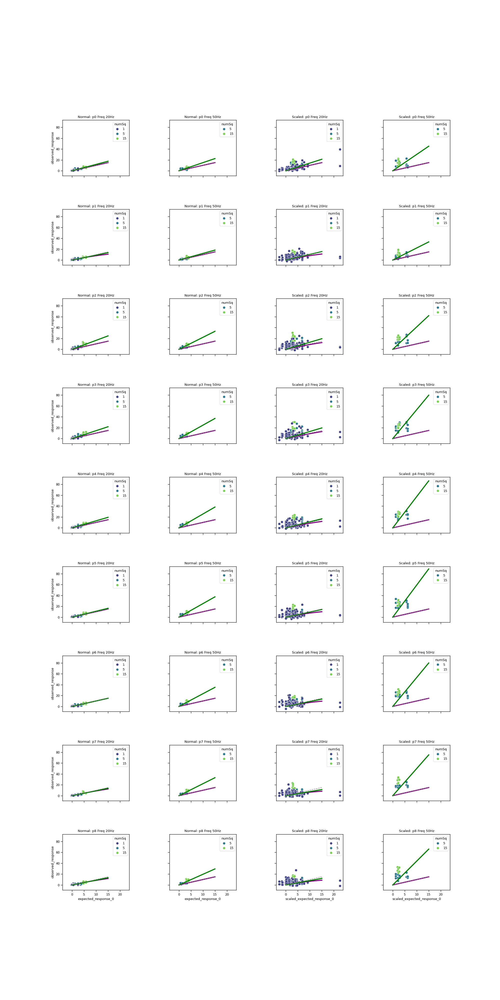

In [33]:
plt.close('all')

Fig3, ax3 = plt.subplots(9,4, sharex=True, sharey=True, figsize=[20, 40])
plt.subplots_adjust(wspace=0.6, hspace=0.6)

color_pulses_lin   = mpl.colormaps['Greens']
color_pulses_gamma = mpl.colormaps['Purples']
### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Plot 3A: Scatterplot and SDN for 4041 = 4041, pulse_index = 0

for j,f in enumerate([20,50]):
    for p in range(9):
        dftemp = df_sdn[(df_sdn['cellID']==4041) & (df_sdn['freq']==f) & (df_sdn['pulse_index']==p)]
        ax3[p,j+2] = sns.scatterplot(data=dftemp, x='scaled_expected_response_0', y='scaled_observed_response', hue='numSq', size='numSq',sizes=[50], ax=ax3[p,j+2], palette=color_squares)
        # add gamma fit
        gammatemp    = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='scaled_expected_response_0') & (sdndf['observed']=='scaled_observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['gamma'].values
        slopetemp    = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='scaled_expected_response_0') & (sdndf['observed']=='scaled_observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['slope'].values
        r2_gammatemp = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='scaled_expected_response_0') & (sdndf['observed']=='scaled_observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['r2_sdn'].values
        r2_slopetemp = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='scaled_expected_response_0') & (sdndf['observed']=='scaled_observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['r2_lin'].values
        
        ax3[p,j+2].plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
        ax3[p,j+2].plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
        ax3[p,j+2].plot([0,15],[0,15], color='grey', linestyle='--')


        ax3[p,j+2].set_title(f'Scaled: p{p} Freq {f}Hz')

        ax3[p,j] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[50], ax=ax3[p,j], palette=color_squares)
        # add gamma fit
        gammatemp    = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='expected_response_0') & (sdndf['observed']=='observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['gamma'].values
        slopetemp    = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='expected_response_0') & (sdndf['observed']=='observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['slope'].values
        r2_gammatemp = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='expected_response_0') & (sdndf['observed']=='observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['r2_sdn'].values
        r2_slopetemp = sdndf[(sdndf['cellID']==4041) & (sdndf['expected']=='expected_response_0') & (sdndf['observed']=='observed_response') & (sdndf['pulse_index']==p) & (sdndf['freq']==f)]['r2_lin'].values
        
        ax3[p,j].plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
        ax3[p,j].plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
        ax3[p,j].plot([0,15],[0,15], color='grey', linestyle='--')

        # title
        ax3[p,j].set_title(f'Normal: p{p} Freq {f}Hz')

## Fig 3

In [ ]:
plt.close('all')

Fig3, ax3 = plt.subplot_mosaic([['A','Ci','Cii'],['B','D','D'],['E','F','G']], figsize=(15,15), )
plt.subplots_adjust(wspace=0.6, hspace=0.6)

color_pulses_lin   = mpl.colormaps['Greens']
color_pulses_gamma = mpl.colormaps['Purples']
### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Plot 3A: Scatterplot and SDN for cell = 3402, pulse_index = 0
ax3['A'].text(-0.1, 1.1, 'A', fontsize=16, ha='center', transform=ax3['A'].transAxes)
dftemp = sdndf_control[(sdndf_control['cellID']==3402) & (sdndf_control['pulse_index']==0)]
ax3['A'] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[150], ax=ax3['A'], palette=color_squares)
# add gamma fit
gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['gamma'].values
slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['slope'].values
r2_gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_sdn'].values
r2_slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_lin'].values

ax3['A'].plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
ax3['A'].plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
ax3['A'].plot([0,15],[0,15], color='grey', linestyle='--')

ax3['A'].set_xlabel('Expected response (mV)')
ax3['A'].set_ylabel('Observed response (mV)')
ax3['A'].legend(loc='upper left')

ax3['A'].set_xlim([0,15])
ax3['A'].set_ylim([0,15])
sns.despine(bottom=False, left=False, ax=ax3['A'])

# ### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3B: lineplot of gamma across all cells, where x-axis: pulse_index, y-axis: gamma, hue: stim_freq
ax3['B'].text(-0.1, 1.1, 'B', fontsize=16, ha='center', transform=ax3['B'].transAxes)
ax3b2 = ax3['B'].twinx()

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdndf_control[(sdndf_control['cellID']==3402) & (sdndf_control['pulse_index']==p)& (sdndf_control['freq']==f)]

        gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['gamma'].values
        slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    
    ax3['B'].plot(np.arange(9), np.array(gammas), color='purple', linewidth=3, label=f'γ ({f} Hz)', alpha=0.2+i*0.2)
    # create a twin axis to plot slopes
    
    ax3b2.plot(np.arange(9), np.array(slopes), color='green', linewidth=3, label=f'm ({f} Hz)', alpha=0.2+i*0.2)
    ax3['B'].spines['right'].set_visible(True)
    ax3['B'].spines['top'].set_visible(True)
    # remove spines

    # set title
    ax3['B'].set_title(f'Freq = {f}Hz')
    # set ylim
    ax3['B'].set_ylim([0,20])
    ax3b2.set_ylim([0,0.75])

    # simplifying the axes
    # plot_tools.simplify_axes(ax3['B'], splines_to_keep=['bottom','left'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=range(0,21,5), ytick_labels=range(0,21,5))
    # plot_tools.add_floating_scalebar(ax3['B'], scalebar_origin=[0.2,15], xlength=1.0, ylength=1.0, labelx='', labely='', unitx='', unity='', fontsize=12, color='purple', linewidth=2, pad=0.1, show_labels=False)
    # plot_tools.simplify_axes(ax3b2, splines_to_keep=['bottom','right'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=np.arange(0,0.8,0.25), ytick_labels=np.arange(0,0.8,0.25))
    # plot_tools.add_floating_scalebar(ax3b2, scalebar_origin=[0.2,0.65], xlength=1.0, ylength=0.1, labelx='', labely='', unitx='', unity='', fontsize=12, color='green', linewidth=2, pad=0.1, show_labels=False)
    sns.despine(bottom=False, left=False, ax=ax3['B'])
    sns.despine(bottom=False, right=False, ax=ax3b2)

    # legend outside
    ax3['B'].legend( bbox_to_anchor=(1.0, 0.0),   loc='lower right')
    ax3b2.legend(    bbox_to_anchor=(0.7, 0.0), loc='lower right')

    ax3['B'].set_xlabel('Pulse index', fontdict={'fontsize':12})
    ax3['B'].set_ylabel('Gamma (γ)', fontdict={'fontsize':12})
    ax3b2.set_ylabel('Slope (m)', fontdict={'fontsize':12})


### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Histogram of gamma values for all the cells in the control condition
ax3['Ci'].text( -0.1, 1.1, 'C i', fontsize=16, ha='center', transform=ax3['Ci'].transAxes)
ax3['Cii'].text(-0.1, 1.1, 'C ii', fontsize=16, ha='center', transform=ax3['Cii'].transAxes)
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
sns.histplot(data=gammadist, x='gamma', color=[129/255,0,127/255], kde=False, ax=ax3['Ci'], alpha=1, edgecolor='None', binwidth=8, )
sns.despine(bottom=False, left=False, ax=ax3['Ci'])
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
sns.histplot(data=gammadist, x='slope', color=[0,128/255,0], kde=False, ax=ax3['Cii'], alpha=1, edgecolor='None', binwidth=0.1, )
sns.despine(bottom=False, left=False, ax=ax3['Cii'])

# change the fontsize of the x and y labels
ax3['Ci'].set_xlabel('Gamma (γ)', fontsize=12)
ax3['Ci'].set_ylabel('Count', fontsize=12)
ax3['Cii'].set_xlabel('Slope (m)', fontsize=12)
ax3['Cii'].set_ylabel('Count', fontsize=12)

# ticks fontsize
ax3['Ci'].tick_params(axis='both', which='major', labelsize=12)
ax3['Cii'].tick_params(axis='both', which='major', labelsize=12)

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3D: Heatmap of slope

bboxD = ax3['D'].get_position()
x0,x1=bboxD.x0,bboxD.x1 
y0,y1=bboxD.y0,bboxD.y1 
w,h=bboxD.width,bboxD.height
barw = 0.03
pad=0.01
shrink = 0.8
# remove axis ax3D
ax3['D'].remove()
# create  a new axis in the position of ax3D
ax3D =  Fig3.add_axes([x0, y0, shrink*w, shrink*h])
ax3Dx = Fig3.add_axes([x0, y0+shrink*h+pad, shrink*w, barw],aspect='auto')
ax3Dy = Fig3.add_axes([x0+shrink*w+pad, y0, barw, shrink*h],aspect='auto')
ax3Dc = Fig3.add_axes([x0+shrink*w+barw+2*pad, y0, barw, shrink*h],aspect='auto')
ax3['D'] = ax3D
ax3['D'].text( -0.1, 1.1/0.8, 'D', fontsize=16, ha='center', transform=ax3['D'].transAxes)

x = gammadf_slice.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='slope')
maxlim = np.round(np.max(x.values[:-1,:-1]),2)

# the scatter plot:
ax3D.imshow(x.iloc[:-1,:-1], cmap='Greens', vmin=0, vmax=maxlim, aspect='auto')
ax3D.set_xticks(np.arange(9), labels=np.arange(9))
ax3D.set_ylim([-0.5,3.5])
ax3D.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3D.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3D.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3D
# remove spines
ax3D.spines['bottom'].set_visible(False)
ax3D.spines['left'].set_visible(False)
ax3D.spines['right'].set_visible(False)
ax3D.spines['top'].set_visible(False)
# ax3D.set_aspect('auto')

# # create new axes on the right and on the top of the current axes
# divider = make_axes_locatable(ax3D)
# # below height and pad are in inches
# ax3Dx = divider.append_axes("top",   0.5, pad=0.1, sharex=ax3D)
# ax3Dy = divider.append_axes("right", 0.5, pad=0.1, sharey=ax3D)
# ax_histy2 = divider.append_axes("right",2.5, pad=0.0, )

# # make some labels invisible
ax3Dx.xaxis.set_tick_params(labelbottom=False)
ax3Dy.yaxis.set_tick_params(labelleft=False)

ax3Dx.imshow(x.iloc[-1,:-1].values.reshape(-1,1).T, cmap='Greens', vmin=0, vmax=maxlim, )
ax3Dy.imshow(x[1000].values[:-1].reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
# # set aspect of ax_histy2 same as ax3Dy
numlevels = 10
Fig3.colorbar(ax3D.get_images()[0], cax=ax3Dc, )
# ax_histy2.imshow(np.linspace(0,maxlim,numlevels+1, endpoint=True).reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
# ax_histy2.set_ylim([-0.50,0.5+numlevels])
# ax_histy2.set_xlim([0,1])
# ax_histy2.set_yticks([0,numlevels/2,numlevels], labels=[0,np.round(maxlim/2,1),np.round(maxlim,1)])

# # remove ticks
ax3Dx.get_xaxis().set_visible(False)
ax3Dx.get_yaxis().set_visible(False)
ax3Dy.get_xaxis().set_visible(False)
ax3Dy.get_yaxis().set_visible(False)
# ax_histy2.get_xaxis().set_visible(False)

# # change fontsize to 12 for all the axes
for ax in [ax3Dx, ax3Dy, ax3Dc]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
ax3Dx.set_aspect('auto')
ax3Dy.set_aspect('auto')

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Voltage clamp plots
prop = 'peak_value'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())]
dfrepivot = dfrepivot[(dfrepivot['Exc']>-500)]
# invert the Exc values as they are negative
dfrepivot['Exc'] = -dfrepivot['Exc']
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

# 1. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='pulse_index', ax=ax3['E'], palette='crest' )
def linfunc(x, m, c):
    return m * x + c
for p in range(9):
    clr = color_pulses_lin(p/8)
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(p)
        continue
    ax3['E'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3['E'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{p}, m={popt[0]:.2f}, c={popt[1]:.2f}')
ax3['E'].set_xlabel('EPSC peak (pA)')
ax3['E'].set_ylabel('IPSC peak (pA)')
ax3['E'].spines['top'].set_visible(False)
ax3['E'].spines['right'].set_visible(False)
ax3['E'].legend(loc='upper left')

# 2. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='cellID', ax=ax3['F'], palette='tab10' )
for i,c in enumerate(cells):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/len(cells))
    ax3['F'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3['F'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}, c={popt[1]:.2f}')
ax3['F'].set_xlabel('EPSC peak (pA)')
ax3['F'].set_ylabel('IPSC peak (pA)')
ax3['F'].spines['top'].set_visible(False)
ax3['F'].spines['right'].set_visible(False)
ax3['F'].legend(loc='upper left')

# 3. Exc vs Inh delay comparison
prop = 'peak_time'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())] 
dfrepivot = dfrepivot[(dfrepivot['Exc']<(2e4/dfrepivot['stimFreq']))]
dfrepivot = dfrepivot[(dfrepivot['Inh']<(2e4/dfrepivot['stimFreq']))]
# invert the Exc values as they are negative
# dfrepivot['Exc'] = -dfrepivot['Exc'] ---
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

for i,c in enumerate([1931,1531,6301,7492]):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/4)
    ax3['G'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5, label=f'{c}')
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3['G'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}')
# sns.kdeplot(data=dfrepivot[(dfrepivot['stimFreq']==20)], x='Exc', y='Inh', hue="pulse_index", fill=False, ax=ax3['G'],levels=1, palette='crest')
ax3['G'].set_xlabel('EPSC Delay (ms)')
ax3['G'].set_ylabel('IPSC Delay (ms)')
ax3['G'].set_xlim([0,30])
ax3['G'].set_ylim([0,30])
ax3['G'].spines['top'].set_visible(False)
ax3['G'].spines['right'].set_visible(False)
ax3['G'].legend()

# --------------- axis control---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# increwase the size of all axis, ticks, and texts

for ax in [ax3b2, *ax3.values()]:
    ax.tick_params(axis='both', which='major', labelsize=12, width=2, length=10)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
        # # increase spine width and tick width
        ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['right'].set_linewidth(2)

## save fig 3
Fig3.savefig(paper_figure_export_location / 'Figure3.png', dpi=300, bbox_inches='tight')
Fig3.savefig(paper_figure_export_location / 'Figure3.svg', dpi=300, bbox_inches='tight')

In [ ]:
gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']==20)]

In [ ]:
plt.close('all')

Fig3, ax3 = plt.subplot_mosaic([['A','Ci','Cii'],['Bi','Di','Di'],['Bii','Dii','Dii'],['E','F','G']], figsize=(15,15), )
plt.subplots_adjust(wspace=0.6, hspace=0.6)

color_pulses_lin = mpl.colormaps['Greens']
color_pulses_gamma = mpl.colormaps['Purples']

sdn_trial     = sdndf_all[  (sdndf_all['clamp']=='CC')   & (sdndf_all['condition']=='Control')   & (sdndf_all['signal']=='cell')   &(sdndf_all['clampPotential']==-70)  ]
gammadf_trial = gammadf_all[(gammadf_all['clamp']=='CC') & (gammadf_all['condition']=='Control') & (gammadf_all['signal']=='cell') &(gammadf_all['clampPotential']==-70)]
# gammdf_slice = gammadf_control[(gammadf_control['expected']=='0') & (gammadf_control['sample_size']!=0)& (gammadf_control['freq']!=100)].copy()
gammdf_slice = gammadf_trial[(gammadf_trial['expected']=='0') & (gammadf_trial['sample_size']!=0)& (gammadf_trial['freq']!=100)].copy()
# drop columns
gammdf_slice.drop(columns=['signal', 'condition', 'clamp'], inplace=True)
### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Plot 3A: Scatterplot and SDN for cell = 3402, pulse_index = 0
ax3['A'].text(-0.1, 1.1, 'A', fontsize=16, ha='center', transform=ax3['A'].transAxes)
dftemp = sdn_trial[(sdn_trial['cellID']==3402) & (sdn_trial['pulse_index']==0)]
ax3['A'] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[75], ax=ax3['A'], palette=color_squares)
# add gamma fit
gammatemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==0)&(gammadf_trial['freq']=='all')]['gamma'].values
slopetemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==0)&(gammadf_trial['freq']=='all')]['slope'].values
r2_gammatemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==0)&(gammadf_trial['freq']=='all')]['r2_sdn'].values
r2_slopetemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==0)&(gammadf_trial['freq']=='all')]['r2_lin'].values

ax3['A'].plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
ax3['A'].plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
ax3['A'].plot([0,15],[0,15], color='grey', linestyle='--')

ax3['A'].set_xlabel('Expected response (mV)')
ax3['A'].set_ylabel('Observed response (mV)')
ax3['A'].legend(loc='upper left')

ax3['A'].set_xlim([0,15])
ax3['A'].set_ylim([0,15])
sns.despine(bottom=False, left=False, ax=ax3['A'])

# ### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3Bi: lineplot of gamma across all cells, where x-axis: pulse_index, y-axis: gamma, hue: stim_freq
ax3['Bi'].text(-0.1, 1.1, 'Bi', fontsize=16, ha='center', transform=ax3['Bi'].transAxes)
ax3['Bii'].text(-0.1, 1.1, 'Bii', fontsize=16, ha='center', transform=ax3['Bii'].transAxes)

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdn_trial[(sdn_trial['cellID']==3402) & (sdn_trial['pulse_index']==p)& (sdn_trial['freq']==f)]

        gammatemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==p)&(gammadf_trial['freq']==f)]['gamma'].values
        slopetemp = gammadf_trial[(gammadf_trial['cellID']==3402)&(gammadf_trial['expected']=='0')&(gammadf_trial['pulse_index']==p)&(gammadf_trial['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    
    ax3['Bi'].plot(np.arange(9), np.array(gammas), color='purple', linewidth=3, label=f'{f} Hz', alpha=0.2+i*0.2)
    ax3['Bi'].spines['right'].set_visible(True)
    ax3['Bi'].spines['top'].set_visible(True)

    ax3['Bi'].set_title(f'Gamma')
    ax3['Bi'].set_ylim([0,20])
    
    # simplifying the axes
    # plot_tools.simplify_axes(ax3['Bi'], splines_to_keep=['bottom','left'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=range(0,21,5), ytick_labels=range(0,21,5))
    # plot_tools.add_floating_scalebar(ax3['Bi'], scalebar_origin=[0.2,15], xlength=1.0, ylength=1.0, labelx='', labely='', unitx='', unity='', fontsize=12, color='purple', linewidth=2, pad=0.1, show_labels=False)
    # plot_tools.simplify_axes(ax3bi2, splines_to_keep=['bottom','right'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=np.arange(0,0.8,0.25), ytick_labels=np.arange(0,0.8,0.25))
    # plot_tools.add_floating_scalebar(ax3bi2, scalebar_origin=[0.2,0.65], xlength=1.0, ylength=0.1, labelx='', labely='', unitx='', unity='', fontsize=12, color='green', linewidth=2, pad=0.1, show_labels=False)
    sns.despine(bottom=False, left=False, ax=ax3['Bi'])

    # legend outside
    ax3['Bi'].legend(    loc='upper right') #bbox_to_anchor=(1.0, 0.0),
    # ax3['Bi'].set_ylabel('Gamma (γ)', fontdict={'fontsize':12})

    ax3['Bii'].plot(np.arange(9), np.array(slopes), color='green', linewidth=3, label=f'{f} Hz', alpha=0.2+i*0.2)
    ax3['Bii'].set_ylim([0,1.0])
    ax3['Bii'].legend(loc='upper right') #bbox_to_anchor=(0.7, 0.0), 
    ax3['Bii'].set_xlabel('Pulse index', fontdict={'fontsize':12})
    # ax3['Bii'].set_ylabel('Slope (m)', fontdict={'fontsize':12})
    ax3['Bii'].set_title(f'Slope')
    sns.despine(bottom=False, left=False, ax=ax3['Bii'])

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Histogram of gamma values for all the cells in the control condition
ax3['Ci'].text( -0.1, 1.1, 'C i', fontsize=16, ha='center', transform=ax3['Ci'].transAxes)
ax3['Cii'].text(-0.1, 1.1, 'C ii', fontsize=16, ha='center', transform=ax3['Cii'].transAxes)
gammadf_slice = gammadf_slice[(gammadf_slice['slope']<80) & (gammadf_slice['slope']>0)]
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
sns.histplot(data=gammadist, x='gamma', color=[129/255,0,127/255], kde=False, ax=ax3['Ci'], alpha=1, edgecolor='None', binwidth=8, )
sns.despine(bottom=False, left=False, ax=ax3['Ci'])
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
sns.histplot(data=gammadist, x='slope', color=[0,128/255,0], kde=False, ax=ax3['Cii'], alpha=1, edgecolor='None', binwidth=0.1, )
sns.despine(bottom=False, left=False, ax=ax3['Cii'])

# change the fontsize of the x and y labels
ax3['Ci'].set_xlabel('Gamma (γ)', fontsize=12)
ax3['Ci'].set_ylabel('Count', fontsize=12)
ax3['Cii'].set_xlabel('Slope (m)', fontsize=12)
ax3['Cii'].set_ylabel('Count', fontsize=12)

# ticks fontsize
ax3['Ci'].tick_params(axis='both', which='major', labelsize=12)
ax3['Cii'].tick_params(axis='both', which='major', labelsize=12)

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3D: Heatmap of gamma
bboxDi = ax3['Di'].get_position()
x0,x1=bboxDi.x0,bboxDi.x1 
y0,y1=bboxDi.y0,bboxDi.y1 
w,h=bboxDi.width,bboxDi.height
barw = 0.03
pad=0.01
shrink = 0.8
# remove axis ax3Di
ax3['Di'].remove()
# create  a new axis in the position of ax3Di
ax3Di =  Fig3.add_axes([x0, y0, shrink*w, shrink*h])
ax3Dix = Fig3.add_axes([x0, y0+shrink*h+pad, shrink*w, barw],aspect='auto')
ax3Diy = Fig3.add_axes([x0+shrink*w+pad, y0, barw, shrink*h],aspect='auto')
ax3Dic = Fig3.add_axes([x0+shrink*w+barw+2*pad, y0, 0.5*barw, shrink*h],aspect='auto')
ax3['Di'] = ax3Di
ax3['Di'].text( -0.1, 1.1/0.8, 'Di', fontsize=16, ha='center', transform=ax3['Di'].transAxes)

x = gammadf_slice.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='gamma')
maxlim = np.round(np.max(x.iloc[1:-1,:-1]),2)

# the scatter plot:
ax3Di.imshow(x.iloc[1:-1,:-1], cmap='Purples', vmin=0, vmax=maxlim, aspect='auto')
ax3Di.set_xticks(np.arange(9), labels=np.arange(9))
ax3Di.set_ylim([-0.5,3.5])
ax3Di.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3Di.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3Di.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})

ax3Di.spines['bottom'].set_visible(False)
ax3Di.spines['left'].set_visible(False)
ax3Di.spines['right'].set_visible(False)
ax3Di.spines['top'].set_visible(False)

# # make some labels invisible
ax3Dix.xaxis.set_tick_params(labelbottom=False)
ax3Diy.yaxis.set_tick_params(labelleft=False)
dy = np.reshape( (x[1000][[20,30,40,50]]).values, (4,-1))[::-1]
dx = np.reshape( (x[[0,1,2,3,4,5,6,7,8]].iloc[-1]).values, (1,-1))
ax3Dix.imshow(dx, cmap='Purples', vmin=0, vmax=maxlim, )
ax3Diy.imshow(dy, cmap='Purples', vmin=0, vmax=maxlim, )

# # set aspect of ax_histy2 same as ax3Diy
numlevels = 10
Fig3.colorbar(ax3Di.get_images()[0], cax=ax3Dic, )

# # remove ticks
ax3Dix.get_xaxis().set_visible(False)
ax3Dix.get_yaxis().set_visible(False)
ax3Diy.get_xaxis().set_visible(False)
ax3Diy.get_yaxis().set_visible(False)

# # change fontsize to 12 for all the axes
for ax in [ax3Dix, ax3Diy, ax3Dic]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
ax3Dix.set_aspect('auto')
ax3Diy.set_aspect('auto')

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3D: Heatmap of slope
bboxDii = ax3['Dii'].get_position()
x0,x1=bboxDii.x0,bboxDii.x1 
y0,y1=bboxDii.y0,bboxDii.y1 
w,h=bboxDii.width,bboxDii.height
barw = 0.03
pad=0.01
shrink = 0.8
# remove axis ax3Dii
ax3['Dii'].remove()
# create  a new axis in the position of ax3Dii
ax3Dii =  Fig3.add_axes([x0, y0, shrink*w, shrink*h])
ax3Diix = Fig3.add_axes([x0, y0+shrink*h+pad, shrink*w, barw],aspect='auto')
ax3Diiy = Fig3.add_axes([x0+shrink*w+pad, y0, barw, shrink*h],aspect='auto')
ax3Diic = Fig3.add_axes([x0+shrink*w+barw+2*pad, y0, 0.5*barw, shrink*h],aspect='auto')
ax3['Dii'] = ax3Dii
ax3['Dii'].text( -0.1, 1.1/0.8, 'Dii', fontsize=16, ha='center', transform=ax3['Dii'].transAxes)

x = gammadf_slice.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='slope')
maxlim = np.round(np.max(x.iloc[1:-1,:-1]),2)

# the scatter plot:
ax3Dii.imshow(x.iloc[1:-1,:-1], cmap='Greens', vmin=0, vmax=maxlim, aspect='auto')
ax3Dii.set_xticks(np.arange(9), labels=np.arange(9))
ax3Dii.set_ylim([-0.5,3.5])
ax3Dii.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3Dii.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3Dii.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3Dii
# remove spines
ax3Dii.spines['bottom'].set_visible(False)
ax3Dii.spines['left'].set_visible(False)
ax3Dii.spines['right'].set_visible(False)
ax3Dii.spines['top'].set_visible(False)

# # make some labels invisible
ax3Diix.xaxis.set_tick_params(labelbottom=False)
ax3Diiy.yaxis.set_tick_params(labelleft=False)

dy = np.reshape( (x[1000][[20,30,40,50]]).values, (4,-1))[::-1]
dx = np.reshape( (x[[0,1,2,3,4,5,6,7,8]].iloc[-1]).values, (1,-1))
ax3Diix.imshow(dx, cmap='Greens', vmin=0, vmax=maxlim, )
ax3Diiy.imshow(dy, cmap='Greens', vmin=0, vmax=maxlim, )

numlevels = 10
Fig3.colorbar(ax3Dii.get_images()[0], cax=ax3Diic, )

# # remove ticks
ax3Diix.get_xaxis().set_visible(False)
ax3Diix.get_yaxis().set_visible(False)
ax3Diiy.get_xaxis().set_visible(False)
ax3Diiy.get_yaxis().set_visible(False)

# # change fontsize to 12 for all the axes
for ax in [ax3Diix, ax3Diiy, ax3Diic]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
ax3Diix.set_aspect('auto')
ax3Diiy.set_aspect('auto')

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Voltage clamp plots
prop = 'peak_value'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())]
dfrepivot = dfrepivot[(dfrepivot['Exc']>-500)]
# invert the Exc values as they are negative
dfrepivot['Exc'] = -dfrepivot['Exc']
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

# 1. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='pulse_index', ax=ax3['E'], palette='crest' )
def linfunc(x, m, c):
    return m * x + c
m,c=0,0
for p in range(9):
    clr = color_pulses_lin(p/8)
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(p)
        continue
    ax3['E'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    m += popt[0]
    c += popt[1]
    ax3['E'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, )#label=f'{p}, m={popt[0]:.2f}, c={popt[1]:.2f}'
m = np.round(m/9,1)
c = np.round(c/9,1)
ax3['E'].set_xlabel('EPSC peak (pA)')
ax3['E'].set_ylabel('IPSC peak (pA)')
# ax3['E'].spines['top'].set_visible(False)
# ax3['E'].spines['right'].set_visible(False)
ax3['E'].legend([], frameon=False)
# add m and c values as text annotation as latex
ann = r'$\bar{m}$'+ '=' + f'{m}, ' + r'$\bar{c}$' + f'={c}'
ax3['E'].text(0.1,0.9, ann, transform=ax3['E'].transAxes, fontsize=12, ha='left', va='center')

sns.despine(bottom=False, left=False, ax=ax3['E'], offset=5)
# 2. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='cellID', ax=ax3['F'], palette='tab10' )
for i,c in enumerate(cells):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/len(cells))
    ax3['F'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3['F'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}, c={popt[1]:.2f}')
ax3['F'].set_xlabel('EPSC peak (pA)')
ax3['F'].set_ylabel('IPSC peak (pA)')
ax3['F'].spines['top'].set_visible(False)
ax3['F'].spines['right'].set_visible(False)
ax3['F'].legend([], frameon=False)

# 3. Exc vs Inh delay comparison
prop = 'peak_time'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())] 
dfrepivot = dfrepivot[(dfrepivot['Exc']<(2e4/dfrepivot['stimFreq']))]
dfrepivot = dfrepivot[(dfrepivot['Inh']<(2e4/dfrepivot['stimFreq']))]
# invert the Exc values as they are negative
# dfrepivot['Exc'] = -dfrepivot['Exc'] ---
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

for i,c in enumerate([1931,1531,6301,7492]):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/4)
    ax3['G'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5, label=f'{c}')
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3['G'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}')
# sns.kdeplot(data=dfrepivot[(dfrepivot['stimFreq']==20)], x='Exc', y='Inh', hue="pulse_index", fill=False, ax=ax3['G'],levels=1, palette='crest')
ax3['G'].set_xlabel('EPSC Delay (ms)')
ax3['G'].set_ylabel('IPSC Delay (ms)')
ax3['G'].set_xlim([0,30])
ax3['G'].set_ylim([0,30])
ax3['G'].spines['top'].set_visible(False)
ax3['G'].spines['right'].set_visible(False)
ax3['G'].legend([], frameon=False)

# --------------- axis control---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# increwase the size of all axis, ticks, and texts

for ax in [ax3bi2, *ax3.values()]:
    ax.tick_params(axis='both', which='major', labelsize=12, width=2, length=10)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
        # # increase spine width and tick width
        ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['right'].set_linewidth(2)

## save fig 3
Fig3.savefig(paper_figure_export_location / 'Figure3.png', dpi=300, bbox_inches='tight')
Fig3.savefig(paper_figure_export_location / 'Figure3.svg', dpi=300, bbox_inches='tight')

### Field response SDN

In [ ]:
gammadf_slice[(gammadf_slice['freq']!=1000)&(gammadf_slice['pulse_index']!=1000)&(gammadf_slice['cellID']!=1000)& (gammadf_slice['cellID']==5611) & (gammadf_slice['expected']==0) & (gammadf_slice['freq']==20)& (gammadf_slice['pulse_index']==0) ]

In [ ]:
sdn_trial     = sdndf_all[  (sdndf_all['signal']=='field') ]
sdndf_all[sdndf_all['cellID' ]==5611]

In [ ]:
plt.close('all')

Fig3_field, ax3suppf = plt.subplot_mosaic([['A','Ci','Cii'],['Bi','Di','Di'],['Bii','Dii','Dii'],['E','F','G']], figsize=(15,15), )
plt.subplots_adjust(wspace=0.6, hspace=0.6)

color_pulses_lin = mpl.colormaps['Greens']
color_pulses_gamma = mpl.colormaps['Purples']

print(gammadf_all.shape, sdndf_all.shape)
sdn_trial     = sdndf_all[  (sdndf_all['signal']=='field')     ]
gammadf_slice = gammadf_all[ (gammadf_all['signal']=='field') & (gammadf_all['expected']=='0')& (gammadf_all['sample_size']!=0) ]
# drop columns
gammadf_slice.drop(columns=['signal', 'condition', 'clamp'], inplace=True)
### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Plot 3A: Scatterplot and SDN for cell = 4041, pulse_index = 0
ax3suppf['A'].text(-0.1, 1.1, 'A', fontsize=16, ha='center', transform=ax3suppf['A'].transAxes)
dftemp = sdn_trial[(sdn_trial['cellID']==4041) & (sdn_trial['pulse_index']==0)]
ax3suppf['A'] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[75], ax=ax3suppf['A'], palette=color_squares)
# add gamma fit
gammatemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==20) & (gammadf_all['cellID']==4041) ]['gamma'].values
slopetemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==20) & (gammadf_all['cellID']==4041) ]['slope'].values
r2_gammatemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==20) & (gammadf_all['cellID']==4041) ]['r2_sdn'].values
r2_slopetemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==20) & (gammadf_all['cellID']==4041) ]['r2_lin'].values

ax3suppf['A'].plot(np.linspace(0,2,100), sdnfunc(np.linspace(0,2,100),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
ax3suppf['A'].plot(np.linspace(0,2,100), nosdn(np.linspace(0,2,100),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
ax3suppf['A'].plot([0,2],[0,2], color='grey', linestyle='--')

ax3suppf['A'].set_xlabel('Expected response (mV)')
ax3suppf['A'].set_ylabel('Observed response (mV)')
ax3suppf['A'].legend(loc='upper left')

ax3suppf['A'].set_xlim([0,2])
ax3suppf['A'].set_ylim([0,2])
sns.despine(bottom=False, left=False, ax=ax3suppf['A'])

# ### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3Bi: lineplot of gamma across all cells, where x-axis: pulse_index, y-axis: gamma, hue: stim_freq
ax3suppf['Bi'].text(-0.1, 1.1, 'Bi', fontsize=16, ha='center', transform=ax3suppf['Bi'].transAxes)
ax3suppf['Bii'].text(-0.1, 1.1, 'Bii', fontsize=16, ha='center', transform=ax3suppf['Bii'].transAxes)

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdn_trial[(sdn_trial['cellID']==4041) & (sdn_trial['pulse_index']==p)& (sdn_trial['freq']==f)]

        gammatemp = gammadf_slice[(gammadf_slice['pulse_index']==p)&(gammadf_slice['freq']==f)]['gamma'].values
        slopetemp = gammadf_slice[(gammadf_slice['pulse_index']==p)&(gammadf_slice['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    
    ax3suppf['Bi'].plot(np.arange(9), np.array(gammas), color='purple', linewidth=3, label=f'{f} Hz', alpha=0.2+i*0.2)
    ax3suppf['Bi'].spines['right'].set_visible(True)
    ax3suppf['Bi'].spines['top'].set_visible(True)

    ax3suppf['Bi'].set_title(f'Gamma')
    ax3suppf['Bi'].set_ylim([0,20])
    
    # simplifying the axes
    # plot_tools.simplify_axes(ax3suppf['Bi'], splines_to_keep=['bottom','left'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=range(0,21,5), ytick_labels=range(0,21,5))
    # plot_tools.add_floating_scalebar(ax3suppf['Bi'], scalebar_origin=[0.2,15], xlength=1.0, ylength=1.0, labelx='', labely='', unitx='', unity='', fontsize=12, color='purple', linewidth=2, pad=0.1, show_labels=False)
    # plot_tools.simplify_axes(ax3bi2, splines_to_keep=['bottom','right'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=np.arange(0,0.8,0.25), ytick_labels=np.arange(0,0.8,0.25))
    # plot_tools.add_floating_scalebar(ax3bi2, scalebar_origin=[0.2,0.65], xlength=1.0, ylength=0.1, labelx='', labely='', unitx='', unity='', fontsize=12, color='green', linewidth=2, pad=0.1, show_labels=False)
    sns.despine(bottom=False, left=False, ax=ax3suppf['Bi'])

    # legend outside
    ax3suppf['Bi'].legend(    loc='upper right') #bbox_to_anchor=(1.0, 0.0),
    # ax3suppf['Bi'].set_ylabel('Gamma (γ)', fontdict={'fontsize':12})

    ax3suppf['Bii'].plot(np.arange(9), np.array(slopes), color='green', linewidth=3, label=f'{f} Hz', alpha=0.2+i*0.2)
    ax3suppf['Bii'].set_ylim([0,1.0])
    ax3suppf['Bii'].legend(loc='upper right') #bbox_to_anchor=(0.7, 0.0), 
    ax3suppf['Bii'].set_xlabel('Pulse index', fontdict={'fontsize':12})
    # ax3suppf['Bii'].set_ylabel('Slope (m)', fontdict={'fontsize':12})
    ax3suppf['Bii'].set_title(f'Slope')
    sns.despine(bottom=False, left=False, ax=ax3suppf['Bii'])

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Histogram of gamma values for all the cells in the control condition
ax3suppf['Ci'].text( -0.1, 1.1, 'C i', fontsize=16, ha='center', transform=ax3suppf['Ci'].transAxes)
ax3suppf['Cii'].text(-0.1, 1.1, 'C ii', fontsize=16, ha='center', transform=ax3suppf['Cii'].transAxes)
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
print(gammadist.shape)
sns.histplot(data=gammadist, x='gamma', color=[129/255,0,127/255], kde=False, ax=ax3suppf['Ci'], alpha=1, edgecolor='None', )
sns.despine(bottom=False, left=False, ax=ax3suppf['Ci'])
gammadist = gammadf_slice[(gammadf_slice['cellID']!=1000) &(gammadf_slice['pulse_index']!=1000) & (gammadf_slice['freq']!=1000)]
print(gammadist.shape)
sns.histplot(data=gammadist, x='slope', color=[0,128/255,0], kde=False, ax=ax3suppf['Cii'], alpha=1, edgecolor='None', )
sns.despine(bottom=False, left=False, ax=ax3suppf['Cii'])

# change the fontsize of the x and y labels
ax3suppf['Ci'].set_xlabel('Gamma (γ)', fontsize=12)
ax3suppf['Ci'].set_ylabel('Count', fontsize=12)
ax3suppf['Cii'].set_xlabel('Slope (m)', fontsize=12)
ax3suppf['Cii'].set_ylabel('Count', fontsize=12)

# ticks fontsize
ax3suppf['Ci'].tick_params(axis='both', which='major', labelsize=12)
ax3suppf['Cii'].tick_params(axis='both', which='major', labelsize=12)

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3D: Heatmap of gamma
bboxDi = ax3suppf['Di'].get_position()
x0,x1=bboxDi.x0,bboxDi.x1 
y0,y1=bboxDi.y0,bboxDi.y1 
w,h=bboxDi.width,bboxDi.height
barw = 0.03
pad=0.01
shrink = 0.8
# remove axis ax3Di
ax3suppf['Di'].remove()
# create  a new axis in the position of ax3Di
ax3Di =  Fig3_field.add_axes([x0, y0, shrink*w, shrink*h])
ax3Dix = Fig3_field.add_axes([x0, y0+shrink*h+pad, shrink*w, barw],aspect='auto')
ax3Diy = Fig3_field.add_axes([x0+shrink*w+pad, y0, barw, shrink*h],aspect='auto')
ax3Dic = Fig3_field.add_axes([x0+shrink*w+barw+2*pad, y0, 0.5*barw, shrink*h],aspect='auto')
ax3suppf['Di'] = ax3Di
ax3suppf['Di'].text( -0.1, 1.1/0.8, 'Di', fontsize=16, ha='center', transform=ax3suppf['Di'].transAxes)
# make all gammadf_slice columns numeric
for col in gammadf_slice.columns:
    gammadf_slice[col] = pd.to_numeric(gammadf_slice[col], errors='coerce')


x = gammadf_slice.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='gamma')
print(x)
maxlim = np.round(np.max(x),2)

# the scatter plot:
ax3Di.imshow(x, cmap='Purples', vmin=0, vmax=maxlim, aspect='auto')
ax3Di.set_xticks(np.arange(9), labels=np.arange(9))
ax3Di.set_ylim([-0.5,3.5])
ax3Di.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3Di.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3Di.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})

ax3Di.spines['bottom'].set_visible(False)
ax3Di.spines['left'].set_visible(False)
ax3Di.spines['right'].set_visible(False)
ax3Di.spines['top'].set_visible(False)

# # make some labels invisible
ax3Dix.xaxis.set_tick_params(labelbottom=False)
ax3Diy.yaxis.set_tick_params(labelleft=False)
dy = np.reshape( (x.iloc[:,-1]).values, (3,-1))[::-1]
dx = np.reshape( (x.iloc[-1,:]).values, (1,-1))
ax3Dix.imshow(dx, cmap='Purples', vmin=0, vmax=maxlim, )
ax3Diy.imshow(dy, cmap='Purples', vmin=0, vmax=maxlim, )

# # set aspect of ax_histy2 same as ax3Diy
numlevels = 10
Fig3_field.colorbar(ax3Di.get_images()[0], cax=ax3Dic, )

# # remove ticks
ax3Dix.get_xaxis().set_visible(False)
ax3Dix.get_yaxis().set_visible(False)
ax3Diy.get_xaxis().set_visible(False)
ax3Diy.get_yaxis().set_visible(False)

# # change fontsize to 12 for all the axes
for ax in [ax3Dix, ax3Diy, ax3Dic]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
ax3Dix.set_aspect('auto')
ax3Diy.set_aspect('auto')

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# # Plot 3D: Heatmap of slope
bboxDii = ax3suppf['Dii'].get_position()
x0,x1=bboxDii.x0,bboxDii.x1 
y0,y1=bboxDii.y0,bboxDii.y1 
w,h=bboxDii.width,bboxDii.height
barw = 0.03
pad=0.01
shrink = 0.8
# remove axis ax3Dii
ax3suppf['Dii'].remove()
# create  a new axis in the position of ax3Dii
ax3Dii =  Fig3_field.add_axes([x0, y0, shrink*w, shrink*h])
ax3Diix = Fig3_field.add_axes([x0, y0+shrink*h+pad, shrink*w, barw],aspect='auto')
ax3Diiy = Fig3_field.add_axes([x0+shrink*w+pad, y0, barw, shrink*h],aspect='auto')
ax3Diic = Fig3_field.add_axes([x0+shrink*w+barw+2*pad, y0, 0.5*barw, shrink*h],aspect='auto')
ax3suppf['Dii'] = ax3Dii
ax3suppf['Dii'].text( -0.1, 1.1/0.8, 'Dii', fontsize=16, ha='center', transform=ax3suppf['Dii'].transAxes)

x = gammadf_slice.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='slope')
maxlim = np.round(np.max(x),2)

# the scatter plot:
ax3Dii.imshow(x.iloc[1:-1,:-1], cmap='Greens', vmin=0, vmax=maxlim, aspect='auto')
ax3Dii.set_xticks(np.arange(9), labels=np.arange(9))
ax3Dii.set_ylim([-0.5,3.5])
ax3Dii.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3Dii.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3Dii.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3Dii
# remove spines
ax3Dii.spines['bottom'].set_visible(False)
ax3Dii.spines['left'].set_visible(False)
ax3Dii.spines['right'].set_visible(False)
ax3Dii.spines['top'].set_visible(False)

# # make some labels invisible
ax3Diix.xaxis.set_tick_params(labelbottom=False)
ax3Diiy.yaxis.set_tick_params(labelleft=False)

dy = np.reshape( (x.iloc[:, -1]).values, (3,-1))[::-1]
dx = np.reshape( (x.iloc[-1,:]).values, (1,-1))
ax3Diix.imshow(dx, cmap='Greens', vmin=0, vmax=maxlim, )
ax3Diiy.imshow(dy, cmap='Greens', vmin=0, vmax=maxlim, )

numlevels = 10
Fig3_field.colorbar(ax3Dii.get_images()[0], cax=ax3Diic, )

# # remove ticks
ax3Diix.get_xaxis().set_visible(False)
ax3Diix.get_yaxis().set_visible(False)
ax3Diiy.get_xaxis().set_visible(False)
ax3Diiy.get_yaxis().set_visible(False)

# # change fontsize to 12 for all the axes
for ax in [ax3Diix, ax3Diiy, ax3Diic]:
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
ax3Diix.set_aspect('auto')
ax3Diiy.set_aspect('auto')

### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# Voltage clamp plots
prop = 'peak_value'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())]
dfrepivot = dfrepivot[(dfrepivot['Exc']>-500)]
# invert the Exc values as they are negative
dfrepivot['Exc'] = -dfrepivot['Exc']
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

# 1. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3suppf['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='pulse_index', ax=ax3suppf['E'], palette='crest' )
def linfunc(x, m, c):
    return m * x + c
m,c=0,0
for p in range(9):
    clr = color_pulses_lin(p/8)
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) &(dfrepivot['cellID']==7492) & (dfrepivot['pulse_index']==p)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(p)
        continue
    ax3suppf['E'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    m += popt[0]
    c += popt[1]
    ax3suppf['E'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, )#label=f'{p}, m={popt[0]:.2f}, c={popt[1]:.2f}'
m = np.round(m/9,1)
c = np.round(c/9,1)
ax3suppf['E'].set_xlabel('EPSC peak (pA)')
ax3suppf['E'].set_ylabel('IPSC peak (pA)')
# ax3suppf['E'].spines['top'].set_visible(False)
# ax3suppf['E'].spines['right'].set_visible(False)
ax3suppf['E'].legend([], frameon=False)
# add m and c values as text annotation as latex
ann = r'$\bar{m}$'+ '=' + f'{m}, ' + r'$\bar{c}$' + f'={c}'
ax3suppf['E'].text(0.1,0.9, ann, transform=ax3suppf['E'].transAxes, fontsize=12, ha='left', va='center')

sns.despine(bottom=False, left=False, ax=ax3suppf['E'], offset=5)
# 2. Exc vs Inh peak comparison
# sns.scatterplot(data=dfrepivot[dfrepivot['pulse_index']==0], x='Exc', y='Inh', ax=ax3suppf['E'], hue='cellID', palette='tab10', s=100)
# sns.scatterplot(data=dfrepivot[dfrepivot['stimFreq']==20], x='Exc', y='Inh', hue='cellID', ax=ax3suppf['F'], palette='tab10' )
for i,c in enumerate(cells):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/len(cells))
    ax3suppf['F'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3suppf['F'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}, c={popt[1]:.2f}')
ax3suppf['F'].set_xlabel('EPSC peak (pA)')
ax3suppf['F'].set_ylabel('IPSC peak (pA)')
ax3suppf['F'].spines['top'].set_visible(False)
ax3suppf['F'].spines['right'].set_visible(False)
ax3suppf['F'].legend([], frameon=False)

# 3. Exc vs Inh delay comparison
prop = 'peak_time'
dftemp = dfmelt[(dfmelt['property']==prop)]
dfrepivot = dftemp.pivot(index=['cellID','stimFreq', 'numSq','patternList','pulse_index','trial'],columns='clampPotential', values='val')
dfrepivot = dfrepivot.reset_index()
# rename column names from -70 to Exc and 0 to Inh
dfrepivot.rename(columns={-70:'Exc', 0:'Inh'}, inplace=True)
# remove all those rows where Exc or Inh is nan
dfrepivot = dfrepivot[~(dfrepivot['Exc'].isna() | dfrepivot['Inh'].isna())] 
dfrepivot = dfrepivot[(dfrepivot['Exc']<(2e4/dfrepivot['stimFreq']))]
dfrepivot = dfrepivot[(dfrepivot['Inh']<(2e4/dfrepivot['stimFreq']))]
# invert the Exc values as they are negative
# dfrepivot['Exc'] = -dfrepivot['Exc'] ---
# make pulse_index column categorical
dfrepivot['pulse_index'] = dfrepivot['pulse_index'].astype('category')

for i,c in enumerate([1931,1531,6301,7492]):
    epsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Exc']
    ipsc = dfrepivot[(dfrepivot['stimFreq']==20) & (dfrepivot['cellID']==c)]['Inh']
    if (epsc.shape[0] == 0) | (ipsc.shape[0]==0):
        print(c)
        continue
    clr = color_cells(i/4)
    ax3suppf['G'].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5, label=f'{c}')
    # add fits
    popt, pcov = curve_fit(linfunc, epsc, ipsc)
    epsc_max = np.max(epsc)
    epsc_min = np.min(epsc)
    fit = linfunc(np.linspace(epsc_min,epsc_max,10), *popt)
    ax3suppf['G'].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{c}, m={popt[0]:.2f}')
# sns.kdeplot(data=dfrepivot[(dfrepivot['stimFreq']==20)], x='Exc', y='Inh', hue="pulse_index", fill=False, ax=ax3suppf['G'],levels=1, palette='crest')
ax3suppf['G'].set_xlabel('EPSC Delay (ms)')
ax3suppf['G'].set_ylabel('IPSC Delay (ms)')
ax3suppf['G'].set_xlim([0,30])
ax3suppf['G'].set_ylim([0,30])
ax3suppf['G'].spines['top'].set_visible(False)
ax3suppf['G'].spines['right'].set_visible(False)
ax3suppf['G'].legend([], frameon=False)

# --------------- axis control---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
# increwase the size of all axis, ticks, and texts

for ax in [ax3bi2, *ax3suppf.values()]:
    ax.tick_params(axis='both', which='major', labelsize=12, width=2, length=10)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
        # # increase spine width and tick width
        ax.spines['left'].set_linewidth(2)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['right'].set_linewidth(2)

## save fig 3
# Fig3_field.savefig(paper_figure_export_location / 'Figure3.png', dpi=300, bbox_inches='tight')
# Fig3_field.savefig(paper_figure_export_location / 'Figure3.svg', dpi=300, bbox_inches='tight')

In [ ]:
gammadf_slice['cellID'].unique()

In [ ]:
dftemp = sdn_trial[(sdn_trial['cellID']==c) & (sdn_trial['pulse_index']==0)& (sdn_trial['freq']==f)]

In [ ]:
gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==50) & (gammadf_all['cellID']==4021) ]['gamma'].values

In [ ]:
figtemp, axtemp = plt.subplots(3,2, figsize=(15,10),sharex=True, sharey=True)
for i,c in enumerate([4041,3751,4021]):
    for j,f in enumerate([20,50]):

        sdn_trial     = sdndf_all[  (sdndf_all['signal']=='field')     ]
        gammadf_slice = gammadf_all[ (gammadf_all['signal']=='field') & (gammadf_all['expected']=='0')& (gammadf_all['sample_size']!=0) ]
        # drop columns
        gammadf_slice.drop(columns=['signal', 'condition', 'clamp'], inplace=True)
        ### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
        # Plot 3A: Scatterplot and SDN for cell = c, pulse_index = 0
        # axtemp[i,j].text(-0.1, 1.1, 'A', fontsize=16, ha='center', transform=axtemp[i,j].transAxes)
        dftemp = sdn_trial[(sdn_trial['cellID']==c) & (sdn_trial['pulse_index']==0)& (sdn_trial['freq']==f)]
        if dftemp.shape[0] == 0:
            continue
        axtemp[i,j] = sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[75], ax=axtemp[i,j], palette=color_squares)
        # add gamma fit
        gammatemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==f) & (gammadf_all['cellID']==c) ]['gamma'].values
        slopetemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==f) & (gammadf_all['cellID']==c) ]['slope'].values
        r2_gammatemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==f) & (gammadf_all['cellID']==c) ]['r2_sdn'].values
        r2_slopetemp = gammadf_slice[ (gammadf_slice['pulse_index']==0) & (gammadf_slice['freq']==f) & (gammadf_all['cellID']==c) ]['r2_lin'].values
        if gammatemp.shape[0]==0:
            continue
        axtemp[i,j].plot(np.linspace(0,2,100), sdnfunc(np.linspace(0,2,100),gammatemp), color='purple', linewidth=3, label=f'γ = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
        axtemp[i,j].plot(np.linspace(0,2,100), nosdn(np.linspace(0,2,100),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
        axtemp[i,j].plot([0,2],[0,2], color='grey', linestyle='--')

        axtemp[i,j].set_xlabel('Expected response (mV)')
        axtemp[i,j].set_ylabel('Observed response (mV)')
        axtemp[i,j].legend(loc='upper left')

        axtemp[i,j].title.set_text(f'CellID = {c}, Freq = {f}')

        axtemp[i,j].set_xlim([0,2])
        axtemp[i,j].set_ylim([0,1])
        sns.despine(bottom=False, left=False, ax=axtemp[i,j])

In [ ]:
# facet = sns.lmplot(data=sdndf_field[(sdndf_field['freq']==20)&(sdndf_field['numSq']>1)], x='expected_response_0', y='observed_response', hue='patternID', row='pulse_index',col='cellID', palette='tab10', scatter_kws={'s':50, 'alpha':0.5}, fit_reg=True)
fig, axs = plt.subplots(3,2, sharey=True, sharex=True, figsize=(12,6))
sdndf_field = sdndf_all[sdndf_all['signal']=='field']
sdndf_field['ObyE'] = sdndf_field['observed_response'] /  sdndf_field['expected_response_0'] 
for i,cell in enumerate(sdndf_field['cellID'].unique()):
    for j,f in enumerate([20,50]):
        sns.boxplot( data=sdndf_field[(sdndf_field['cellID']==cell) & (sdndf_field['freq']==f) & ((sdndf_field['pulse_index']==0)|(sdndf_field['pulse_index']==8))],x='numSq', y='ObyE', hue='pulse_index', palette={0:'green', 8:'purple'}, ax=axs[i,j], linewidth=0.5)

### Check poisson train VC data for delay

In [ ]:
trainVCdf = pd.read_hdf(data_path / "all_cells_SpikeTrain_VC_long.h5", key='data')

In [ ]:
# go over each row of the df
import pulselocs_default as pl
stimtimes = pl.SpikeTrain
evokedDict = []
for i in range(trainVCdf.shape[0]):
    idx = trainVCdf.index[i]
    pot = trainVCdf.loc[idx, 'clampPotential']
    sq = trainVCdf.loc[idx, 'numSq']
    pat = trainVCdf.loc[idx, 'patternList']
    cell = trainVCdf.iloc[i,49:220049]
    led = trainVCdf.iloc[i,440049:660049]

    for stim in stimtimes:
        # print(i, idx, type(pot), pot+10, pat, sq, stim)
        evoked_response = np.abs(cell[stim:stim+1000])
        stimtrace = led[stim:stim+1000]
        # if pot == -70:
        #     evoked_response *= -1
        peak_delay = np.argmax(evoked_response) - stim
        rown = np.concatenate( [ [int(i)], [int(idx)], [int(pot)], [int(pat)], [int(sq)], [peak_delay], evoked_response, stimtrace ], axis=0)
        evokedDict.append(rown)
    
evokedDF = pd.DataFrame(evokedDict, columns=['i', 'index', 'clampPotential', 'patternID', 'numSq', 'peak_delay', *np.arange(1000), *np.arange(1000)])
        

In [ ]:
fig, ax =plt.subplots(3,3, figsize=(12,12), sharex=True, sharey=True)
ax = ax.flatten()
for i,p in enumerate(evokedDF['patternID'].unique()):
    eSTA = evokedDF[(evokedDF['patternID']==p) & (evokedDF['clampPotential']== -70) ]
    iSTA = evokedDF[(evokedDF['patternID']==p) & (evokedDF['clampPotential']== 0) ]
    if eSTA.shape[0] == 0 | iSTA.shape[0] == 0:
        continue
    print(eSTA.shape, iSTA.shape)
    for k in range(eSTA.shape[0]):
        ax[i].plot(np.linspace(0, 50, 1000), -100 -1*eSTA.iloc[k,6:1006], color='green', alpha=0.1)
        ax[i].plot(np.linspace(0, 50, 1000), -300 +100*eSTA.iloc[k,1006:], color='blue', alpha=0.1)
    for k in range(iSTA.shape[0]):
        ax[i].plot(np.linspace(0, 50, 1000),  100 + iSTA.iloc[k,6:1006], color='purple', alpha=0.1)
        ax[i].plot(np.linspace(0, 50, 1000),  300 + 100*iSTA.iloc[k,1006:], color='red', alpha=0.1)

    ax[i].set_title(f'Pattern {p}')
    ax[i].set_xlabel('response after a stim pulse (ms)')
    ax[i].set_ylabel('PSC (pA)')
    ax[i].set_xlim([0,20])
    
    sns.despine(bottom=False, left=False, ax=ax[i])

plt.tight_layout()

In [ ]:
fig, ax =plt.subplots(1,2, figsize=(12,4), sharex=True, sharey=True)
ax = ax.flatten()
for i,p in enumerate(evokedDF['numSq'].unique()):
    eSTA = evokedDF[(evokedDF['numSq']==p) & (evokedDF['clampPotential']== -70) ]
    iSTA = evokedDF[(evokedDF['numSq']==p) & (evokedDF['clampPotential']== 0) ]
    # for k in range(eSTA.shape[0]):
    ax[i].plot(np.linspace(0, 50, 1000), np.mean(-1*eSTA.iloc[:,6:1006], axis=0), color='green', alpha=1.0)
    # ax[i].plot(np.linspace(0, 50, 1000), np.mean(-100 +100*eSTA.iloc[:,1006:], axis=0), color='blue', alpha=1.0)
    # for k in range(iSTA.shape[0]):
    ax[i].plot(np.linspace(0, 50, 1000),  np.mean(iSTA.iloc[:,6:1006], axis=0), color='purple', alpha=1.0)
    ax[i].plot(np.linspace(0, 50, 1000),  np.mean(100*iSTA.iloc[:,1006:], axis=0), color='cyan', alpha=1.0)
    print(p, np.argmax(np.mean(iSTA.iloc[:,6:1006], axis=0))/20, np.argmax(np.mean(eSTA.iloc[:,6:1006], axis=0))/20)

    ax[i].set_title(f'NumSq {p}')
    ax[i].set_xlabel('response after a stim pulse (ms)')
    ax[i].set_ylabel('PSC (pA)')
    ax[i].set_xlim([0,20])
    
    sns.despine(bottom=False, left=False, ax=ax[i])

plt.tight_layout()

### plot response peaks between P1 and P2 for E and I with error bars

In [ ]:
def rsquare(func, popt, x, y):
    residuals = y- func(x, *popt)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y-np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)

    return r_squared

def linear(x, m):
    return m*x 

In [ ]:
EvsI = pd.DataFrame(columns=['cellID', 'stimFreq', 'pulse_index', 'EvsI_slope', 'EvsI_intercept', 'EvsI_r2'])
cells = dfrepivot['cellID'].unique()
figtemp, axtemp = plt.subplots(3,len(cells), figsize=(15,15))
counter = 0
for i,c in enumerate(cells):
    for j,f in enumerate([20,30,50]):
        print(c,f)u
        for p in range(9):
            clr = color_pulses_lin(p/8)
            epsc = []
            ipsc = []
            for pat in range(46,56):
                exc = np.mean(dfrepivot[(dfrepivot['stimFreq']==f) &(dfrepivot['cellID']==c) & (dfrepivot['pulse_index']==p)& (dfrepivot['patternList']==pat)]['Exc']) 
                inh = np.mean(dfrepivot[(dfrepivot['stimFreq']==f) &(dfrepivot['cellID']==c) & (dfrepivot['pulse_index']==p)& (dfrepivot['patternList']==pat)]['Inh']) 
                # if either exc or inh is a nan, then skip this pattern
                if np.isnan(exc) | np.isnan(inh):
                    continue
                epsc.append( exc )
                ipsc.append( inh )
            print(c,f,p,len(epsc), len(ipsc))
            epsc = np.array(epsc)
            ipsc = np.array(ipsc)
            print(epsc)
            print(ipsc)
            if (epsc.shape[0]<3) | (ipsc.shape[0]<3):                
                continue
            # is epsc or ipsc have nans
            if np.isnan(epsc).any() | np.isnan(ipsc).any():
                continue
            axtemp[j,i].scatter(epsc, ipsc, s=50, color=clr, edgecolor=None, alpha=0.5)
            # add fits
            popt, pcov = curve_fit(linear, epsc, ipsc)
            epsc_max = np.max(epsc)
            epsc_min = np.min(epsc)
            fit = linear(np.linspace(epsc_min,epsc_max,10), *popt)

            r_squared = rsquare(linear, popt, epsc, ipsc)

            dict_temp = {'cellID':c, 'stimFreq':f, 'pulse_index':p, 'EvsI_slope':popt[0], 'EvsI_intercept':popt[1], 'EvsI_r2':r_squared}

            axtemp[j,i].plot(np.linspace(epsc_min,epsc_max,10), fit, color=clr, linestyle='-', linewidth=3, label=f'{p}, m={popt[0]:.2f}, c={popt[1]:.2f}, r2={r_squared:.2f}')
            axtemp[j,i].set_xlabel('EPSC peak (pA)')
            axtemp[j,i].set_ylabel('IPSC peak (pA)')
            axtemp[j,i].spines['top'].set_visible(False)
            axtemp[j,i].spines['right'].set_visible(False)
            axtemp[j,i].legend(loc='upper left', fontsize=8)
            axtemp[j,i].set_title(f'CellID: {c}, Freq: {f}Hz')

            EvsI = pd.concat([EvsI, pd.DataFrame(dict_temp, index=[counter])])

In [ ]:
EvsI.describe()

In [ ]:
fig, ax = plt.subplots()
sns.histplot(data=EvsI, x='EvsI_slope', hue='cellID', palette='tab10',ax=ax, kde=True)

In [ ]:

# plot slopes across all cells (columns), freq (rows), x = pulse_index, y = slope
EvsI['stimFreq'] = EvsI['stimFreq'].astype('category')
g = sns.FacetGrid(data=EvsI, col='cellID', hue='stimFreq', sharex=True, sharey=True)
g2 = sns.FacetGrid(data=EvsI, col='cellID', hue='stimFreq', sharex=True, sharey=True)
# g.map(sns.lineplot, 'pulse_index', 'EvsI_r2', )
g.map(sns.lineplot, 'pulse_index', 'EvsI_slope', )
g2.map(sns.lineplot, 'pulse_index', 'EvsI_intercept', )
# g2.map(sns.lineplot, 'pulse_index', 'EvsI_intercept', )

for cell in EvsI['cellID'].unique():
    for f in [20,30,50]:
        irE = vcpropdf[(vcpropdf['cellID']==cell) & (vcpropdf['stimFreq']==f) & (vcpropdf['clampPotential']==-70) ]['IR'].mean()
        irI = vcpropdf[(vcpropdf['cellID']==cell) & (vcpropdf['stimFreq']==f) & (vcpropdf['clampPotential']==0) ]['IR'].mean()
        raE = vcpropdf[(vcpropdf['cellID']==cell) & (vcpropdf['stimFreq']==f) & (vcpropdf['clampPotential']==-70) ]['tau'].mean()
        raI = vcpropdf[(vcpropdf['cellID']==cell) & (vcpropdf['stimFreq']==f) & (vcpropdf['clampPotential']==0) ]['tau'].mean()
        print(cell, f, np.round(irE / irI,2), np.round(raE,1), np.round(raI,1))


In [ ]:
figtemp, axtemp = plt.subplots()
sns.stripplot(data=EvsI, x='pulse_index', y='EvsI_slope', hue='stimFreq', ax=axtemp, dodge=True, s=10, alpha=1 )
# draw median lines for each freq
medians = EvsI.groupby(['stimFreq','pulse_index'])['EvsI_slope'].median()
for i,f in enumerate([20,30,50]):
    medians[f].plot(ax=axtemp, linestyle='-', linewidth=3, label=f'{f}')
axtemp.hlines(y=1, xmin=-1, xmax=9, color='grey', linestyle='--')
axtemp.legend()

In [ ]:
figtemp, axtemp = plt.subplots()
sns.boxplot(data=EvsI, x='pulse_index', y='EvsI_intercept', hue='stimFreq', ax=axtemp, )
axtemp.hlines(y=0, xmin=-1, xmax=9, color='grey', linestyle='--')

## Make intensity vs field response peak

In [ ]:
# reindex the whole df
alldf = pd.read_hdf(data_path / "all_cells_FreqSweep_CC_long.h5", key='data')
alldf = alldf.reset_index(drop=True)
alldf['patternList'] = alldf['patternList'].astype(int)

In [ ]:
# field_p2p is the the peak_to_peak response from 'probePulseTime' to 'probePulseTime'+1000 for each row
alldf['field_p2p'] = alldf.apply(lambda x: np.max(x[40049+int(2e4*x['probePulseStart']):40049+1000+int(2e4*x['probePulseStart'])]) - np.min(x[40049+int(2e4*x['probePulseStart']) : 40049+1000+int(2e4*x['probePulseStart'])]) , axis=1)

In [ ]:
# cellID for which both data exists for intensity = 50 and 100
cells50 = alldf[ alldf['intensity']==50]['cellID'].unique()
cells100 = alldf[ alldf['intensity']==100]['cellID'].unique()

# cellsboth = np.intersection([cells50, cells100])
print(cells50, cells100, )

In [ ]:
tempdf = alldf[ (alldf['cellID'].isin([5621,])) ]
tempdf['norm_field_p2p'] = tempdf['field_p2p'] / tempdf['numSq']
fig, ax = plt.subplots(1,1, figsize=(10, 6))
sns.lineplot(data=tempdf, x='intensity', y='norm_field_p2p', hue='patternList', ax=ax, palette='crest')
ax.set_xticks([50,100], labels=[50,100])

In [ ]:
ax.set_xticks([50,100], labels=[50,100])

### Fig. 5A: SDN for a sample cell 3402

In [ ]:
fig3a, ax3a = plt.subplots(1,1, figsize=(5,5))
dftemp = sdndf_control[(sdndf_control['cellID']==3402)&(sdndf_control['pulse_index']==0)]
sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[150], ax=ax3a, palette=color_squares)
# add gamma fit
gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['gamma'].values
slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['slope'].values
r2_gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_sdn'].values
r2_slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_lin'].values

ax3a.plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, label=f'γ  = {gammatemp[0]:.2f} ($R^2$= {r2_gammatemp[0]:.2f})')
ax3a.plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp),   color='green', linewidth=3,    label=f'm = {slopetemp[0]:.2f} ($R^2$= {r2_slopetemp[0]:.2f})')
ax3a.plot([0,15],[0,15], color='grey', linestyle='--')

ax3a.set_xlabel('Expected response (mV)', fontdict={'fontsize':12})
ax3a.set_ylabel('Observed response (mV)', fontdict={'fontsize':12})
ax3a.legend(loc='upper left')

ax3a.set_xlim([0,15])
ax3a.set_ylim([0,15])
sns.despine(bottom=False, left=False)

# change axis font size
ax3a.tick_params(axis='both', which='major', labelsize=12)

# save fig
fig3a.savefig(paper_figure_export_location / 'Fig3A_cell3402_pulse0_SDN_fit.png', dpi=300)
fig3a.savefig(paper_figure_export_location / 'Fig3A_cell3402_pulse0_SDN_fit.svg')

### Fig 3B: SDN across pulses for the sample cell 3402, subplots for each frequency

In [ ]:
Fig3B, ax3b = plt.subplots(2,2, figsize=(12,12), sharex=True, sharey=True)
ax3b = ax3b.flatten()
color_pulses_lin = mpl.colormaps['Reds']
color_pulses_gamma = mpl.colormaps['Purples']

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdndf_control[(sdndf_control['cellID']==3402) & (sdndf_control['pulse_index']==p)& (sdndf_control['freq']==f)]
        sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[150,150], ax=ax3b[i], palette=color_squares, legend=False)
        ax3b[i].set_xlim([0,15])
        ax3b[i].set_ylim([0,15])
        sns.despine(bottom=False, left=False)
        # add gamma fit
        gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['gamma'].values
        slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)
        
        ax3b[i].plot(np.linspace(0,15,25), sdnfunc(np.linspace(0,15,25),gammatemp), color=color_pulses_gamma(2/(p+1)), linewidth=3, )
        ax3b[i].plot(np.linspace(0,15,25), nosdn(np.linspace(0,15,25),slopetemp),   color=color_pulses_lin(2/(p+1)), linewidth=3,)
        ax3b[i].plot([0,15],[0,15], color='grey', linestyle='--')

        ax3b[i].set_xlabel('Expected response (mV)', fontdict={'fontsize':12})
        ax3b[i].set_ylabel('Observed response (mV)', fontdict={'fontsize':12})

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    insetplot = ax3b[i].inset_axes([0.1,0.7,0.5,0.2])
    insetplot.plot(np.arange(9), np.array(gammas), color='purple', linewidth=2, label='γ')
    # insetplot.sett_ylim([0,20])
    # insetplot.set_ylabel('γ')
    # insetplot.set_yticks(np.arange(0,21,10), labels=np.arange(0,21,10))
    # create a twin axis to plot slopes
    insetplot2 = insetplot.twinx()
    insetplot2.plot(np.arange(9), np.array(slopes), color='green', linewidth=2, label='m')
    # insetplot.sett_ylim([0,20])
    # insetplot2.set_ylabel('m')
    # insetplot2.set_yticks(np.arange(0,0.8,0.25), labels=np.arange(0,0.8,0.25))

    # set title
    ax3b[i].set_title(f'Freq = {f}Hz')
    # change axis font size
    ax3b[i].tick_params(axis='both', which='major', labelsize=12)



# # save fig
# Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_all_pulses_SDN_fit.png', dpi=300)
# Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_all_pulses_SDN_fit.svg')

In [ ]:
Fig3B, ax3b = plt.subplots(4,1, figsize=(6,12))#, sharex=True, sharey=True)
ax3b = ax3b.flatten()
color_pulses_lin = mpl.colormaps['Reds']
color_pulses_gamma = mpl.colormaps['Purples']

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdndf_control[(sdndf_control['cellID']==3402) & (sdndf_control['pulse_index']==p)& (sdndf_control['freq']==f)]

        gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['gamma'].values
        slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    
    ax3b[i].plot(np.arange(9), np.array(gammas), color='purple', linewidth=2, label='γ')
    # create a twin axis to plot slopes
    ax3b2 = ax3b[i].twinx()
    ax3b2.plot(np.arange(9), np.array(slopes), color='green', linewidth=2, label='m')
    ax3b[i].spines['right'].set_visible(True)
    ax3b[i].spines['top'].set_visible(True)
    # remove spines

    # set title
    ax3b[i].set_title(f'Freq = {f}Hz')
    # set ylim
    ax3b[i].set_ylim([0,20])
    ax3b2.set_ylim([0,0.75])

    # simplifying the axes
    plot_tools.simplify_axes(ax3b[i], splines_to_keep=['bottom','left'], axis_offset=10, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=range(0,21,5), ytick_labels=range(0,21,5))
    plot_tools.add_floating_scalebar(ax3b[i], scalebar_origin=[0.2,15], xlength=1.0, ylength=1.0, labelx='', labely='', unitx='', unity='', fontsize=12, color='purple', linewidth=2, pad=0.1, show_labels=False)
    plot_tools.simplify_axes(ax3b2, splines_to_keep=['bottom','right'], axis_offset=10, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=np.arange(0,0.8,0.25), ytick_labels=np.arange(0,0.8,0.25))
    plot_tools.add_floating_scalebar(ax3b2, scalebar_origin=[0.2,0.65], xlength=1.0, ylength=0.1, labelx='', labely='', unitx='', unity='', fontsize=12, color='green', linewidth=2, pad=0.1, show_labels=False)

# # # save fig
Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_freq_all_pulses_SDN_fit.png', dpi=300)
Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_freq_all_pulses_SDN_fit.svg')

In [ ]:
# Fig3B, ax3['B'] = plt.subplots(1,1, figsize=(8,5))#, sharex=True, sharey=True)
# ax3['B'] = ax3['B'].flatten()
ax3b2 = ax3['B'].twinx()

for i,f in enumerate([20,30,40,50]):
    gammas = []
    slopes = []
    for p in range(9):

        dftemp = sdndf_control[(sdndf_control['cellID']==3402) & (sdndf_control['pulse_index']==p)& (sdndf_control['freq']==f)]

        gammatemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['gamma'].values
        slopetemp = gammadf_control[(gammadf_control['cellID']==3402)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']==f)]['slope'].values
        gammas.append(gammatemp)
        slopes.append(slopetemp)

    # add a subplot insert in top left corner of the subplot and make a line plot of gammas and slopes there
    
    ax3['B'].plot(np.arange(9), np.array(gammas), color='purple', linewidth=3, label=f'γ ({f} Hz)', alpha=0.2+i*0.2)
    # create a twin axis to plot slopes
    
    ax3b2.plot(np.arange(9), np.array(slopes), color='green', linewidth=3, label=f'm ({f} Hz)', alpha=0.2+i*0.2)
    ax3['B'].spines['right'].set_visible(True)
    ax3['B'].spines['top'].set_visible(True)
    # remove spines

    # set title
    ax3['B'].set_title(f'Freq = {f}Hz')
    # set ylim
    ax3['B'].set_ylim([0,20])
    ax3b2.set_ylim([0,0.75])

    # simplifying the axes
    plot_tools.simplify_axes(ax3['B'], splines_to_keep=['bottom','left'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=range(0,21,5), ytick_labels=range(0,21,5))
    plot_tools.add_floating_scalebar(ax3['B'], scalebar_origin=[0.2,15], xlength=1.0, ylength=1.0, labelx='', labely='', unitx='', unity='', fontsize=12, color='purple', linewidth=2, pad=0.1, show_labels=False)
    plot_tools.simplify_axes(ax3b2, splines_to_keep=['bottom','right'], axis_offset=5, remove_ticks=True, xtick_locs=range(9), xtick_labels=range(9), ytick_locs=np.arange(0,0.8,0.25), ytick_labels=np.arange(0,0.8,0.25))
    plot_tools.add_floating_scalebar(ax3b2, scalebar_origin=[0.2,0.65], xlength=1.0, ylength=0.1, labelx='', labely='', unitx='', unity='', fontsize=12, color='green', linewidth=2, pad=0.1, show_labels=False)

    # legend outside
    ax3['B'].legend( bbox_to_anchor=(1.1, 1),   loc='upper right')
    ax3b2.legend(bbox_to_anchor=(1.1, 0.5), loc='upper right')

    ax3['B'].set_xlabel('Pulse index', fontdict={'fontsize':12})
    ax3['B'].set_ylabel('Gamma (γ)', fontdict={'fontsize':12})
    ax3b2.set_ylabel('Slope (m)', fontdict={'fontsize':12})



    

# # # save fig
# Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_freq_all_pulses_SDN_fit2.png', dpi=300)
# Fig3B.savefig(paper_figure_export_location / 'Fig3B_cell3402_freq_all_pulses_SDN_fit2.svg')

### Fig 3C: SDN for all the cells, for pulse 0 (hence across all frequencies)

In [ ]:
Fig3C, ax3c = plt.subplots(1,1, figsize=(5,5))
for cell in sdndf_control['cellID'].unique():

    dftemp = sdndf_control[(sdndf_control['cellID']==cell)&(sdndf_control['pulse_index']==0)]
    sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[150,150], ax=ax3c, palette=color_squares, legend=False)
    ax3c.set_xlim([0,15])
    ax3c.set_ylim([0,15])
    sns.despine(bottom=False, left=False)
    # add gamma fit
    gammatemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['gamma'].values
    slopetemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['slope'].values
    ax3c.plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, )
    ax3c.plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp), color='green', linewidth=3,)
    ax3c.plot([0,15],[0,15], color='grey', linestyle='--')

    ax3c.set_xlabel('Expected response (mV)', fontdict={'fontsize':12})
    ax3c.set_ylabel('Observed response (mV)', fontdict={'fontsize':12})

    # set xticks fontsize to 12
    ax3c.tick_params(axis='both', which='major', labelsize=12)

# save fig
Fig3C.savefig(paper_figure_export_location / 'Fig3C_all_cells_pulse0_SDN_fit.png', dpi=300)
Fig3C.savefig(paper_figure_export_location / 'Fig3C_all_cells_pulse0_SDN_fit.svg')

### Fig. 3A Supp 1: SDN for pulse 0, split across cells

In [ ]:
cells = sdndf_control['cellID'].unique()
fig3As1, ax3As1 = plt.subplots(4,3 ,figsize=(10,10), layout='constrained')
ax3As1 = ax3As1.flatten()
for i,cell in enumerate(cells):

    dftemp = sdndf_control[(sdndf_control['cellID']==cell)&(sdndf_control['pulse_index']==0)]
    sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[50,50], ax=ax3As1[i], palette=color_squares)
    ax3As1[i].set_xlim([0,12])
    ax3As1[i].set_ylim([0,12])
    sns.despine(bottom=False, left=False)
    # add gamma fit
    gammatemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['gamma'].values[0]
    slopetemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['slope'].values[0]
    r2gammatemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_sdn'].values[0]
    r2slopetemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_lin'].values[0]
    ax3As1[i].plot(np.linspace(0,12,20), sdnfunc(np.linspace(0,12,20),gammatemp), color='purple', linewidth=3, )
    ax3As1[i].plot(np.linspace(0,12,20), nosdn(np.linspace(0,12,20),slopetemp), color='green', linewidth=3,)
    ax3As1[i].plot([0,12],[0,12], color='grey', linestyle='--')

    ax3As1[i].set_xlabel('Expected response (mV)')
    ax3As1[i].set_ylabel('Observed response (mV)')
    ax3As1[i].set_title(f'{cell}')

    # add gamma and slope values to the subplot
    ax3As1[i].text(0.5,0.9, f'γ = {np.round(gammatemp,1)}, R2 = {np.round(r2gammatemp,2)}', transform=ax3As1[i].transAxes)
    ax3As1[i].text(0.5,0.8, f'm = {np.round(slopetemp,1)}, R2 = {np.round(r2slopetemp,2)}', transform=ax3As1[i].transAxes)

# save fig
fig3As1.savefig(paper_figure_export_location / 'Fig3As1_all_cells_pulse0_SDN_fit.png', dpi=300)
fig3As1.savefig(paper_figure_export_location / 'Fig3As1_all_cells_pulse0_SDN_fit.svg')


### Fig3D: Gamma Histogram across all control cells

In [ ]:
gammadftemp = gammadf_control[(gammadf_control['sample_size']>6) &(gammadf_control['gamma']>0.01) & (gammadf_control['gamma']<80) & (gammadf_control['expected']!='n') &	(gammadf_control['cellID']!='all') &	(gammadf_control['pulse_index']!='all') &	(gammadf_control['freq']!='all')]
sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
g = np.tile(list("0123456789"), 50)
plt.close('all')
# Initialize the FacetGrid object
pal = 'crest' #sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(gammadftemp, row="pulse_index", hue="pulse_index",  aspect=15, height=.5, palette=pal)

def label(x, color, label):
      ax = plt.gca()
      ax.text(0.1, .2, label, fontweight="bold", color=color, fontsize=12,  
                  ha="left", va="center", transform=ax.transAxes, zorder=10)

# Draw the densities in a few steps
g.map(sns.kdeplot, "gamma",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5)
g.map(sns.kdeplot, "gamma", clip_on=False, color="w", lw=2, bw_adjust=.5)

# passing color=None to refline() uses the hue mapping
g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

# # Remove axes details that don't play well with overlap
g.map(label, "gamma")
g.figure.subplots_adjust(hspace=-.25)

g.set_titles("")
g.set(yticks=[], ylabel="")
g.despine(bottom=True, left=True)
# # Set the subplots to overlap
# save figs png and svg
g.savefig(paper_figure_export_location / 'Fig3D_gamma_vs_pulse_index_kdeplot.png', dpi=300)
g.savefig(paper_figure_export_location / 'Fig3D_gamma_vs_pulse_index_kdeplot.svg')

### Fig 3D Supplementary: Gamma KDE plot for frequencies 20-50Hz

In [ ]:
freqs=[20,30,40,50]
for freq in freqs:
      gammadftemp = gammadf_control[(gammadf_control['freq']==freq) & (gammadf_control['sample_size']>6) &(gammadf_control['gamma']>0.01) & (gammadf_control['gamma']<80) & (gammadf_control['expected']!='n') &	(gammadf_control['cellID']!='all') &	(gammadf_control['pulse_index']!='all') &	(gammadf_control['freq']!='all')]
      sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})
      g = np.tile(list("0123456789"), 50)
      plt.close('all')
      # Initialize the FacetGrid object
      pal = 'crest' #sns.cubehelix_palette(10, rot=-.25, light=.7)
      g = sns.FacetGrid(gammadftemp, row="pulse_index", hue="pulse_index",  aspect=15, height=.5, palette=pal)

      def label(x, color, label):
            ax = plt.gca()
            ax.text(0.1, .2, label, fontweight="bold", color=color, fontsize=12,  
                        ha="left", va="center", transform=ax.transAxes, zorder=10)

      # Draw the densities in a few steps
      g.map(sns.kdeplot, "gamma",
            bw_adjust=.5, clip_on=False,
            fill=True, alpha=1, linewidth=1.5)
      g.map(sns.kdeplot, "gamma", clip_on=False, color="w", lw=2, bw_adjust=.5)

      # passing color=None to refline() uses the hue mapping
      g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

      # # Remove axes details that don't play well with overlap
      g.map(label, "gamma")
      g.figure.subplots_adjust(hspace=-.25)

      g.set_titles("")
      g.set(yticks=[], ylabel="")
      g.despine(bottom=True, left=True)
      # save figs png and svg
      g.savefig(paper_figure_export_location / f'Fig3Ds1_gamma_vs_pulse_index_{freq}Hz_kdeplot.png', dpi=300)
      g.savefig(paper_figure_export_location / f'Fig3Ds1_gamma_vs_pulse_index_{freq}Hz_kdeplot.svg')

### Fig3A Supp3: SDN plot with Action potentials : Only 1 CC cells that showed spikes has 1sq data

In [ ]:
cells = sdndf_control['cellID'].unique()
fig3As3, ax3As3 = plt.subplots(4,3 ,figsize=(10,10), layout='constrained')
ax3As3 = ax3As3.flatten()
for i,cell in enumerate(cells):

    dftemp = sdndf_control[(sdndf_control['cellID']==cell)&(sdndf_control['pulse_index']==0)]
    sns.scatterplot(data=dftemp, x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[50,50], ax=ax3As3[i], palette=color_squares)
    # ax3As3[i].set_xlim([0,12])
    # ax3As3[i].set_ylim([0,12])
    sns.despine(bottom=False, left=False)
    # add gamma fit
    gammatemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['gamma'].values[0]
    slopetemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['slope'].values[0]
    r2gammatemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_sdn'].values[0]
    r2slopetemp = gammadf_control[(gammadf_control['cellID']==cell)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==0)&(gammadf_control['freq']=='all')]['r2_lin'].values[0]
    ax3As3[i].plot(np.linspace(0,12,20), sdnfunc(np.linspace(0,12,20),gammatemp), color='purple', linewidth=3, )
    ax3As3[i].plot(np.linspace(0,12,20), nosdn(np.linspace(0,12,20),slopetemp), color='green', linewidth=3,)
    ax3As3[i].plot([0,12],[0,12], color='grey', linestyle='--')

    ax3As3[i].set_xlabel('Expected response (mV)')
    ax3As3[i].set_ylabel('Observed response (mV)')
    ax3As3[i].set_title(f'{cell}')
    ax3As3[i].legend(loc='upper left', title='NumSq', title_fontsize='10', fontsize='8', frameon=False, facecolor=[0,0,0,0])

    # add gamma and slope values to the subplot
    ax3As3[i].text(0.5,0.9, f'γ = {np.round(gammatemp,1)}, R2 = {np.round(r2gammatemp,2)}', transform=ax3As3[i].transAxes)
    ax3As3[i].text(0.5,0.8, f'm = {np.round(slopetemp,1)}, R2 = {np.round(r2slopetemp,2)}', transform=ax3As3[i].transAxes)

# save fig
fig3As3.savefig(paper_figure_export_location / 'Fig3As3_all_cells_pulse0_SDN_fit_withAP.png', dpi=300)
fig3As3.savefig(paper_figure_export_location / 'Fig3As3_all_cells_pulse0_SDN_fit_withAP.svg')

### Fig 3A Supp 4: Cell 3192 Pulse 0, SDN with AP

In [ ]:
fig3As4, ax3As4 = plt.subplots(3,3, figsize=(10,10), layout='constrained')
ax3As4=ax3As4.flatten()
for p in range(9):
    dftemp = sdndf_control[(sdndf_control['cellID']==3192)&(sdndf_control['pulse_index']==p)]
    sns.scatterplot(data=dftemp[dftemp['observed_response']<20], x='expected_response_0', y='observed_response', hue='numSq', size='numSq',sizes=[75,75], ax=ax3As4[p], palette=color_squares)
    sns.scatterplot(data=dftemp[dftemp['observed_response']>20], x='expected_response_0', y=20, marker='|', hue='numSq', size='numSq',sizes=[150], ax=ax3As4[p], palette=color_squares)
    ax3As4[p].set_xlim([0,12])
    ax3As4[p].set_ylim([0,25])
    sns.despine(bottom=False, left=False)
    # add gamma fit
    gammatemp = gammadf_control[(gammadf_control['cellID']==3192)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']=='all')]['gamma'].values
    slopetemp = gammadf_control[(gammadf_control['cellID']==3192)&(gammadf_control['expected']=='0')&(gammadf_control['pulse_index']==p)&(gammadf_control['freq']=='all')]['slope'].values
    ax3As4[p].plot(np.linspace(0,15,20), sdnfunc(np.linspace(0,15,20),gammatemp), color='purple', linewidth=3, )
    ax3As4[p].plot(np.linspace(0,15,20), nosdn(np.linspace(0,15,20),slopetemp), color='green', linewidth=3,)
    ax3As4[p].plot([0,15],[0,15], color='grey', linestyle='--')

    ax3As4[p].set_xlabel('Expected response (mV)')
    ax3As4[p].set_ylabel('Observed response (mV)')
    ax3As4[p].legend(loc='upper left')
    ax3As4[p].legend([], frameon=False)

# save fig
fig3As4.savefig(paper_figure_export_location / 'Fig3As4_cell3192_pulse0_SDN_fit_with_AP.png', dpi=300)
fig3As4.savefig(paper_figure_export_location / 'Fig3As4_cell3192_pulse0_SDN_fit_with_AP.svg')

### Fig3D Supp 2: Stripplot of gamma values for each pulse index

In [ ]:
Fig3Ds2, ax3Ds2 = plt.subplots()
sns.stripplot(data=gammadf_control[(gammadf_control['expected']=='0') & (gammadf_control['sample_size']!=0)], x='pulse_index', y='gamma', hue='pulse_index', palette='crest', ax=ax3Ds2)
ax3Ds2.set_ylim(0, 80)
ax3Ds2.legend([], frameon=False)
sns.despine(top=True, right=True)
# save
Fig3Ds2.savefig(paper_figure_export_location / f'Fig3Ds2_gamma_vs_pulse_index.png', dpi=300)
Fig3Ds2.savefig(paper_figure_export_location / f'Fig3Ds2_gamma_vs_pulse_index.svg')

### Fig 3D Supp 3: Stripplot of gamma vs pulse index for different frequencies

In [ ]:
Fig3Ds3, ax3Ds3 = plt.subplots()
sns.stripplot(data=gammadf_control[(gammadf_control['expected']=='0') & (gammadf_control['sample_size']!=0)], x='pulse_index', y='gamma', hue='freq', palette='magma', dodge=True, ax=ax3Ds3)
ax3Ds3.set_ylim(0, 80)
ax3Ds3.legend([], frameon=False)
sns.despine(top=True, right=True)
# save
# Fig3Ds3.savefig(paper_figure_export_location / f'Fig3Ds3_gamma_vs_pulse_index_vs_freq.png', dpi=300)
# Fig3Ds3.savefig(paper_figure_export_location / f'Fig3Ds3_gamma_vs_pulse_index_vs_freq.svg')

### Fig 3E: Gamma Heatmap

In [ ]:
# make a heatmap of gamma values, where x-axis is pulse_index and y-axis is freq, for each pulse_index, freq combination, take mean of the gamma values
# first get the mean values when grouped by freq and pulse_index
mean_gamma = gammadf_control[(gammadf_control['expected']=='0') & (gammadf_control['sample_size']!=0)& (gammadf_control['freq']!=100)].copy()
# remove all the rows which have gamma is either above 80 or nan
mean_gamma = mean_gamma[(mean_gamma['gamma']<80) & (mean_gamma['gamma']>0)]
# make all the columns numeric
mean_gamma['gamma'] = pd.to_numeric(mean_gamma['gamma'])
#change pulse_index and freq to numeric, replace 'all' with 1000
mean_gamma['pulse_index']   = mean_gamma['pulse_index'].replace('all', 1000).astype('float32')
mean_gamma['cellID']        = mean_gamma['cellID'].replace('all', 1000).astype('float32')
mean_gamma['freq']          = mean_gamma['freq'].replace('all', 1000).astype('float32')
# in the column expectated, replace 'n' with 1 and '0' with 0
mean_gamma['expected'] = mean_gamma['expected'].replace('n', 1).astype('float32')
mean_gamma['expected'] = mean_gamma['expected'].replace('0', 0).astype('float32')

In [ ]:
x = mean_gamma.groupby(['pulse_index', 'freq']).mean().reset_index()
# make a seaborn heatmap with x axis pulse_index and y axis as freq
# pivot the dataframe
x = x.pivot(index='freq', columns='pulse_index', values='gamma')
Fig3E, ax3E = plt.subplots()
sns.heatmap(x, cmap='Purples', ax=ax3E, vmin=0, vmax=16)
# get ticklabels and replace 1000 with All
yticks = ax3E.get_yticklabels()
xticks = ax3E.get_xticklabels()
ax3E.set_yticklabels([f'{int(float(i.get_text()))}' if i.get_text() != '1000.0' else 'All' for i in yticks])
ax3E.set_xticklabels([f'{int(float(i.get_text()))}' if i.get_text() != '1000.0' else 'All' for i in xticks])
ax3E.set_xlabel('Pulse Index')
ax3E.set_ylabel('Frequency (Hz)')
# set colorbar label
cbar = ax3E.collections[0].colorbar
cbar.set_label('Mean Gamma')
# save fig
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meangamma_vs_pulse_index_vs_freq_heatmap.png', dpi=300)
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meangamma_vs_pulse_index_vs_freq_heatmap.svg')

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl

x = mean_gamma.groupby(['pulse_index', 'freq']).mean().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='gamma')
maxlim = np.round(np.max(x.values[:-1,:-1]),2)
Fig3E, ax3E = plt.subplots(figsize=(5.5, 5.5))

# the scatter plot:
ax3E.imshow(x.iloc[:-1,:-1], cmap='Purples', vmin=0, vmax=maxlim, aspect='auto')
ax3E.set_aspect(1.)
ax3E.set_xticks(np.arange(9), labels=np.arange(9))
# ax3E.set_yticks()
ax3E.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3E.set_ylim([-0.5,3.5])
ax3E.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3E.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3E
# remove spines
ax3E.spines['bottom'].set_visible(False)
ax3E.spines['left'].set_visible(False)

# create new axes on the right and on the top of the current axes
divider = make_axes_locatable(ax3E)
# below height and pad are in inches
ax_histx = divider.append_axes("top",   0.5, pad=0., sharex=ax3E)
ax_histy = divider.append_axes("right", 0.5, pad=0., sharey=ax3E)
ax_histy2 = divider.append_axes("right",1.5, pad=0., )

# make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

ax_histx.imshow(x.iloc[-1,:-1].values.reshape(-1,1).T, cmap='Purples', vmin=0, vmax=maxlim, )
ax_histy.imshow(x[1000].values[:-1].reshape(-1,1), cmap='Purples', vmin=0, vmax=maxlim, )
# set aspect of ax_histy2 same as ax_histy
numlevels = 10
ax_histy2.imshow(np.linspace(0,maxlim,numlevels+1, endpoint=True).reshape(-1,1), cmap='Purples', vmin=0, vmax=maxlim, )
ax_histy2.set_ylim([-0.50,0.5+numlevels])
ax_histy2.set_xlim([0,1])
ax_histy2.set_aspect(0.25)
ax_histy2.set_yticks([0,numlevels/2,numlevels], labels=[0,np.round(maxlim/2,1),np.round(maxlim,1)])

# remove ticks
ax_histx.get_xaxis().set_visible(False)
ax_histx.get_yaxis().set_visible(False)
ax_histy.get_xaxis().set_visible(False)
ax_histy.get_yaxis().set_visible(False)
ax_histy2.get_xaxis().set_visible(False)
# ax_histy2.get_yaxis().set_visible(False)

# remove axis spines
ax_histx.spines['bottom'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy2.spines['bottom'].set_visible(False)
ax_histy2.spines['left'].set_visible(False)

# change fontsize to 12 for all the axes
for ax in [ax3E, ax_histx, ax_histy, ax_histy2]:
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)

# remove white space from figure
plt.tight_layout()

# save Fig3E
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meangamma_vs_pulse_index_vs_freq_heatmap.png', dpi=300)
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meangamma_vs_pulse_index_vs_freq_heatmap.svg')

In [ ]:
x = mean_gamma.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='gamma')
maxlim = np.round(np.max(x.values[:-1,:-1]),2)
Fig3E, ax3E = plt.subplots(figsize=(5.5, 5.5))

# the scatter plot:
ax3E.imshow(x.iloc[:-1,:-1], cmap='Purples', vmin=0, vmax=maxlim, aspect='auto')
ax3E.set_aspect(1.)
ax3E.set_xticks(np.arange(9), labels=np.arange(9))
# ax3E.set_yticks()
ax3E.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3E.set_ylim([-0.5,3.5])
ax3E.set_xlabel('Pulse Index',fontdict={'fontsize':12})
ax3E.set_ylabel('Frequency (Hz)',fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3E
# remove spines
ax3E.spines['bottom'].set_visible(False)
ax3E.spines['left'].set_visible(False)

# create new axes on the right and on the top of the current axes
divider = make_axes_locatable(ax3E)
# below height and pad are in inches
ax_histx = divider.append_axes("top",   0.5, pad=0., sharex=ax3E)
ax_histy = divider.append_axes("right", 0.5, pad=0., sharey=ax3E)
ax_histy2 = divider.append_axes("right",1.5, pad=0., )

# make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

ax_histx.imshow(x.iloc[-1,:-1].values.reshape(-1,1).T, cmap='Purples', vmin=0, vmax=maxlim, )
ax_histy.imshow(x[1000].values[:-1].reshape(-1,1), cmap='Purples', vmin=0, vmax=maxlim, )
# set aspect of ax_histy2 same as ax_histy
numlevels = 10
ax_histy2.imshow(np.linspace(0,maxlim,numlevels+1, endpoint=True).reshape(-1,1), cmap='Purples', vmin=0, vmax=maxlim, )
ax_histy2.set_ylim([-0.50,0.5+numlevels])
ax_histy2.set_xlim([0,1])
ax_histy2.set_aspect(0.25)
ax_histy2.set_yticks([0,numlevels/2,numlevels], labels=[0,np.round(maxlim/2,1),np.round(maxlim,1)])

# remove ticks
ax_histx.get_xaxis().set_visible(False)
ax_histx.get_yaxis().set_visible(False)
ax_histy.get_xaxis().set_visible(False)
ax_histy.get_yaxis().set_visible(False)
ax_histy2.get_xaxis().set_visible(False)
# ax_histy2.get_yaxis().set_visible(False)

# remove axis spines
ax_histx.spines['bottom'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy2.spines['bottom'].set_visible(False)
ax_histy2.spines['left'].set_visible(False)

# change fontsize to 12 for all the axes
for ax in [ax3E, ax_histx, ax_histy, ax_histy2]:
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
        
# remove white space from figure
plt.tight_layout()

# save Fig3E
Fig3E.savefig(paper_figure_export_location / f'Fig3E_mediangamma_vs_pulse_index_vs_freq_heatmap.png', dpi=300)
Fig3E.savefig(paper_figure_export_location / f'Fig3E_mediangamma_vs_pulse_index_vs_freq_heatmap.svg')

### Fig3E: Slope heatmaps

In [ ]:
# make a heatmap of slope values, where x-axis is pulse_index and y-axis is freq, for each pulse_index, freq combination, take mean of the slope values
# first get the mean values when grouped by freq and pulse_index
mean_gamma = gammadf_control[(gammadf_control['expected']=='0') & (gammadf_control['sample_size']!=0)& (gammadf_control['freq']!=100)].copy()
# remove all the rows which have slope is either above 80 or nan
mean_gamma = mean_gamma[(mean_gamma['slope']<80) & (mean_gamma['slope']>0)]
# make all the columns numeric
mean_gamma['slope'] = pd.to_numeric(mean_gamma['slope'])
#change pulse_index and freq to numeric, replace 'all' with 1000
mean_gamma['pulse_index']   = mean_gamma['pulse_index'].replace('all', 1000).astype('float32')
mean_gamma['cellID']        = mean_gamma['cellID'].replace('all', 1000).astype('float32')
mean_gamma['freq']          = mean_gamma['freq'].replace('all', 1000).astype('float32')
# in the column expectated, replace 'n' with 1 and '0' with 0
mean_gamma['expected'] = mean_gamma['expected'].replace('n', 1).astype('float32')
mean_gamma['expected'] = mean_gamma['expected'].replace('0', 0).astype('float32')

In [ ]:
x = mean_gamma.groupby(['pulse_index', 'freq']).mean().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='slope')
maxlim = np.round(np.max(x.values[:-1,:-1]),2)
Fig3E, ax3E = plt.subplots(figsize=(5.5, 5.5))

# the scatter plot:
ax3E.imshow(x.iloc[:-1,:-1], cmap='Greens', vmin=0, vmax=maxlim, aspect='auto')
ax3E.set_aspect(1.)
ax3E.set_xticks(np.arange(9), labels=np.arange(9))
# ax3E.set_yticks()
ax3E.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3E.set_ylim([-0.5,3.5])
ax3E.set_xlabel('Pulse Index',fontdict={'fontsize':12})
ax3E.set_ylabel('Frequency (Hz)',fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3E
# remove spines
ax3E.spines['bottom'].set_visible(False)
ax3E.spines['left'].set_visible(False)

# create new axes on the right and on the top of the current axes
divider = make_axes_locatable(ax3E)
# below height and pad are in inches
ax_histx = divider.append_axes("top",   0.5, pad=0., sharex=ax3E)
ax_histy = divider.append_axes("right", 0.5, pad=0., sharey=ax3E)
ax_histy2 = divider.append_axes("right",1.5, pad=0., )

# make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

ax_histx.imshow(x.iloc[-1,:-1].values.reshape(-1,1).T, cmap='Greens', vmin=0, vmax=maxlim, )
ax_histy.imshow(x[1000].values[:-1].reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
# set aspect of ax_histy2 same as ax_histy
numlevels = 10
ax_histy2.imshow(np.linspace(0,maxlim,numlevels+1, endpoint=True).reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
ax_histy2.set_ylim([-0.50,0.5+numlevels])
ax_histy2.set_xlim([0,1])
ax_histy2.set_aspect(0.25)
ax_histy2.set_yticks([0,numlevels/2,numlevels], labels=[0,np.round(maxlim/2,1),np.round(maxlim,1)])

# remove ticks
ax_histx.get_xaxis().set_visible(False)
ax_histx.get_yaxis().set_visible(False)
ax_histy.get_xaxis().set_visible(False)
ax_histy.get_yaxis().set_visible(False)
ax_histy2.get_xaxis().set_visible(False)
# ax_histy2.get_yaxis().set_visible(False)

# remove axis spines
ax_histx.spines['bottom'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy2.spines['bottom'].set_visible(False)
ax_histy2.spines['left'].set_visible(False)

# change fontsize to 12 for all the axes
for ax in [ax3E, ax_histx, ax_histy, ax_histy2]:
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)
        
# remove white space from figure
plt.tight_layout()

# save Fig3E
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meanslope_vs_pulse_index_vs_freq_heatmap.png', dpi=300)
Fig3E.savefig(paper_figure_export_location / f'Fig3E_meanslope_vs_pulse_index_vs_freq_heatmap.svg')

In [ ]:
x = mean_gamma.groupby(['pulse_index', 'freq']).median().reset_index()
x = x.pivot(index='freq', columns='pulse_index', values='slope')
maxlim = np.round(np.max(x.values[:-1,:-1]),2)
Fig3E, ax3E = plt.subplots(figsize=(5.5, 5.5))

# the scatter plot:
ax3E.imshow(x.iloc[:-1,:-1], cmap='Greens', vmin=0, vmax=maxlim, aspect='auto')
ax3E.set_aspect(1.)
ax3E.set_xticks(np.arange(9), labels=np.arange(9))
# ax3E.set_yticks()
ax3E.set_yticks([0,1,2,3], labels=[20,30,40,50])
ax3E.set_ylim([-0.5,3.5])
ax3E.set_xlabel('Pulse Index', fontdict={'fontsize':12})
ax3E.set_ylabel('Frequency (Hz)', fontdict={'fontsize':12})
# remove ticks but keep tick labels from axis ax3E
# remove spines
ax3E.spines['bottom'].set_visible(False)
ax3E.spines['left'].set_visible(False)

# create new axes on the right and on the top of the current axes
divider = make_axes_locatable(ax3E)
# below height and pad are in inches
ax_histx = divider.append_axes("top",   0.5, pad=0., sharex=ax3E)
ax_histy = divider.append_axes("right", 0.5, pad=0., sharey=ax3E)
ax_histy2 = divider.append_axes("right",1.5, pad=0., )

# make some labels invisible
ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

ax_histx.imshow(x.iloc[-1,:-1].values.reshape(-1,1).T, cmap='Greens', vmin=0, vmax=maxlim, )
ax_histy.imshow(x[1000].values[:-1].reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
# set aspect of ax_histy2 same as ax_histy
numlevels = 10
ax_histy2.imshow(np.linspace(0,maxlim,numlevels+1, endpoint=True).reshape(-1,1), cmap='Greens', vmin=0, vmax=maxlim, )
ax_histy2.set_ylim([-0.50,0.5+numlevels])
ax_histy2.set_xlim([0,1])
ax_histy2.set_aspect(0.25)
ax_histy2.set_yticks([0,numlevels/2,numlevels], labels=[0,np.round(maxlim/2,1),np.round(maxlim,1)])

# remove ticks
ax_histx.get_xaxis().set_visible(False)
ax_histx.get_yaxis().set_visible(False)
ax_histy.get_xaxis().set_visible(False)
ax_histy.get_yaxis().set_visible(False)
ax_histy2.get_xaxis().set_visible(False)
# ax_histy2.get_yaxis().set_visible(False)

# remove axis spines
ax_histx.spines['bottom'].set_visible(False)
ax_histx.spines['left'].set_visible(False)
ax_histy.spines['bottom'].set_visible(False)
ax_histy.spines['left'].set_visible(False)
ax_histy2.spines['bottom'].set_visible(False)
ax_histy2.spines['left'].set_visible(False)

# change fontsize to 12 for all the axes
for ax in [ax3E, ax_histx, ax_histy, ax_histy2]:
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(12)

# remove white space from figure
plt.tight_layout()

# save Fig3E
Fig3E.savefig(paper_figure_export_location / f'Fig3E_medianslope_vs_pulse_index_vs_freq_heatmap.png', dpi=300)
Fig3E.savefig(paper_figure_export_location / f'Fig3E_medianslope_vs_pulse_index_vs_freq_heatmap.svg')

### Delay between E and I

### Gamma distribution in Aanchal-Sahil's paper

<img src="notes_figures\elife-43415-fig4-v3.jpg" width=700>

### Fig 3F: Distribution of Gamma and Slope values

In [ ]:
# histogram of all gama values
fig, ax = plt.subplots(1,2)
gammadist = mean_gamma[(mean_gamma['cellID']!=1000) &(mean_gamma['pulse_index']!=1000) & (mean_gamma['freq']!=1000)]
sns.histplot(data=gammadist, x='gamma', color=[129/255,0,127/255], kde=False, ax=ax[0], alpha=1, edgecolor='None', binwidth=8, )
gammadist = mean_gamma[(mean_gamma['cellID']!=1000) &(mean_gamma['pulse_index']!=1000) & (mean_gamma['freq']!=1000)]
sns.histplot(data=gammadist, x='slope', color=[0,128/255,0], kde=False, ax=ax[1], alpha=1, edgecolor='None', binwidth=0.1, )

# change the fontsize of the x and y labels
ax[0].set_xlabel('Gamma', fontsize=12)
ax[0].set_ylabel('Count', fontsize=12)
ax[1].set_xlabel('Slope', fontsize=12)
ax[1].set_ylabel('Count', fontsize=12)

# ticks fontsize
ax[0].tick_params(axis='both', which='major', labelsize=12)
ax[1].tick_params(axis='both', which='major', labelsize=12)


fig.tight_layout()
# # save fig
# fig.savefig(paper_figure_export_location / 'Fig3F_gamma_slope_hist.png', dpi=300)
# fig.savefig(paper_figure_export_location / 'Fig3F_gamma_slope_hist.svg')

In [ ]:
# g = sns.jointplot(
#     data=mean_gamma[(mean_gamma['freq']!=1000) & (mean_gamma['pulse_index']!=1000)],
#     x="pulse_index", y="gamma", hue='freq',
#     kind="scatter",palette='viridis' #'scatter', 'hist', 'hex', 'kde', 'reg', 'resid'
# )

### E-I delays from VC data

### VC data

In [ ]:
dfshort2 = pd.read_hdf(r"C:\Users\adity\OneDrive\NCBS\Lab\Projects\EI_Dynamics\Analysis\parsed_data\all_cells_VC_response_features.h5", key='data',)
print(dfshort2.shape)
dfshort2 = dfshort2[dfshort2['intensity']==100]
print(dfshort2.shape)                              

### Plot the delays between E and I and other stuff

In [ ]:
dfshort2.sample(10)

In [ ]:
# remove rows from dfshort2 inwhich auc_full has nan values
dfshort2 = dfshort2[~dfshort2['auc_full'].isna()]
print(dfshort2.shape)   

In [ ]:
dfvcmelt = dfshort2.melt(id_vars=['cellID', 'exptID', 'clampPotential','numSq','stimFreq','sweep', 'pulse_index','patternList'], value_vars=['valley_time','peak_time','valley_value','peak_value','auc_response','auc_full'], var_name='prop', value_name='prop_value',)
dfvcmelt['patternList'] = dfvcmelt['patternList'].to_numpy()
dfvcmelt['patternList'] = dfvcmelt['patternList'].astype('int')
dfvcmelt['clampPotential'] = dfvcmelt['clampPotential'].replace(-70, 'Exc')
dfvcmelt['clampPotential'] = dfvcmelt['clampPotential'].replace(0, 'Inh')

In [ ]:
from scipy import stats
from scipy.optimize import curve_fit
cells = dfshort2['cellID'].unique()
fig, ax = plt.subplots(4,3, figsize=(10,10), sharex=True, sharey=True)
fig.suptitle('Response onset time for each cell - E vs I')
ax = ax.flatten()
for i,c in enumerate(cells):
    cellexc = []
    cellinh = []
    
    for p,pat in enumerate(range(46,56)):
        exc = 1000*dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==-70)& (dfshort2['valley_time']!=0)]['valley_time'].values
        inh = 1000*dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==0)& (dfshort2['valley_time']!=0)]['valley_time'].values
        if len(exc) > 1 and len(inh) > 1:
            meanexc = np.mean(exc)
            meaninh = np.mean(inh)
            delexc = [np.min(exc), np.max(exc)]
            delinh = [np.min(inh), np.max(inh)]
            # pick a color from viridis palette
            clr = viridis(i/len(cells))
            ax[i].scatter(meanexc, meaninh, color=clr)
            ax[i].plot( delexc, [meaninh, meaninh],color=clr)
            ax[i].plot([meanexc, meanexc], delinh, color=clr)
            ax[i].set_xlim([0,12])
            ax[i].set_ylim([0,12])
            cellexc.append(meanexc)
            cellinh.append(meaninh)
    ax[i].plot([0,12],[0,12], color='grey', linestyle='--')
    ax[i].set_xlabel('Exc onset (ms)')
    ax[i].set_ylabel('Inh onset (ms)')
    # add subplot title
    ax[i].set_title(f'{c}')
    # add a linear curvefit to each plot, keep the interceptfixed at 0
    if len(cellexc) > 1 and len(cellinh) > 1:
        m, _ = curve_fit(lambda x, m: m*x, cellexc, cellinh)
        x = np.linspace(0, 12, 20)
        y = m*x
        ax[i].plot(x, y, color=clr)

fig.tight_layout()
# save fig
fig.savefig(paper_figure_export_location / 'Fig3Gs1_exc_vs_inh_onset_time_across_cells.png', dpi=300)
fig.savefig(paper_figure_export_location / 'Fig3Gs1_exc_vs_inh_onset_time_across_cells.svg')


In [ ]:
cells = dfshort2['cellID'].unique()
fig, ax = plt.subplots(4,3, figsize=(10,10), sharex=True, sharey=True)
fig.suptitle('Response Peaks for each cell - E vs I')
ax = ax.flatten()
for i,c in enumerate(cells):
    cellexc = []
    cellinh = []
    
    for p,pat in enumerate(range(46,56)):
        exc = dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==-70)& (dfshort2['valley_time']!=0)]['peak_value'].values
        inh = dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==0)& (dfshort2['valley_time']!=0)]['peak_value'].values
        if len(exc) > 1 and len(inh) > 1:
            meanexc = np.mean(exc)
            meaninh = np.mean(inh)
            delexc = [np.min(exc), np.max(exc)]
            delinh = [np.min(inh), np.max(inh)]
            # pick a color from viridis palette
            clr = viridis(i/len(cells))
            ax[i].scatter(meanexc, meaninh, color=clr)
            ax[i].plot( delexc, [meaninh, meaninh],color=clr)
            ax[i].plot([meanexc, meanexc], delinh, color=clr)
            # ax[i].set_xlim([0,500])
            # ax[i].set_ylim([0,500])
            cellexc.append(meanexc)
            cellinh.append(meaninh)
    ax[i].plot([-500,0],[-500,0], color='grey', linestyle='--')
    ax[i].set_xlabel('Exc Peak (ms)')
    ax[i].set_ylabel('Inh Peak (ms)')
    # add subplot title
    ax[i].set_title(f'{c}')
    # add a linear curvefit to each plot, keep the interceptfixed at 0
    if len(cellexc) > 1 and len(cellinh) > 1:
        m, _ = curve_fit(lambda x, m: m*x, cellexc, cellinh)
        x = np.linspace(-500, 0, 20)
        y = m*x
        ax[i].plot(x, y, color=clr)

fig.tight_layout()
# save fig
fig.savefig(paper_figure_export_location / 'Fig3Gs2_exc_vs_inh_peaks_across_cells.png', dpi=300)
fig.savefig(paper_figure_export_location / 'Fig3Gs2_exc_vs_inh_peaks_across_cells.svg')


In [ ]:
cells = dfshort2['cellID'].unique()
fig, ax = plt.subplots(4,3, figsize=(10,10), sharex=True, sharey=True)
fig.suptitle('Response Peak Time for each cell - E vs I')
ax = ax.flatten()
for i,c in enumerate(cells):
    cellexc = []
    cellinh = []
    
    for p,pat in enumerate(range(46,56)):
        exc = 1000*dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==-70)& (dfshort2['valley_time']!=0)]['peak_time'].values
        inh = 1000*dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==0)& (dfshort2['valley_time']!=0)]['peak_time'].values
        if len(exc) > 1 and len(inh) > 1:
            meanexc = np.mean(exc)
            meaninh = np.mean(inh)
            delexc = [np.min(exc), np.max(exc)]
            delinh = [np.min(inh), np.max(inh)]
            # pick a color from viridis palette
            clr = viridis(i/len(cells))
            ax[i].scatter(meanexc, meaninh, color=clr)
            ax[i].plot( delexc, [meaninh, meaninh],color=clr)
            ax[i].plot([meanexc, meanexc], delinh, color=clr)
            ax[i].set_xlim([0,25])
            ax[i].set_ylim([0,25])
            cellexc.append(meanexc)
            cellinh.append(meaninh)
    ax[i].plot([0,25],[0,25], color='grey', linestyle='--')
    ax[i].set_xlabel('Exc Peak Time (ms)')
    ax[i].set_ylabel('Inh Peak Time (ms)')
    # add subplot title
    ax[i].set_title(f'{c}')
    # add a linear curvefit to each plot, keep the interceptfixed at 0
    if len(cellexc) > 1 and len(cellinh) > 1:
        m, _ = curve_fit(lambda x, m: m*x, cellexc, cellinh)
        x = np.linspace(0, 25, 20)
        y = m*x
        ax[i].plot(x, y, color=clr)

fig.tight_layout()
# save fig
fig.savefig(paper_figure_export_location / 'Fig3Gs3_exc_vs_inh_peaktime_across_cells.png', dpi=300)
fig.savefig(paper_figure_export_location / 'Fig3Gs3_exc_vs_inh_peaktime_across_cells.svg')


In [ ]:
cells = dfshort2['cellID'].unique()
fig, ax = plt.subplots(4,3, figsize=(10,10), sharex=True, sharey=True)
fig.suptitle('Response Area for each cell - E vs I')
ax = ax.flatten()
for i,c in enumerate(cells):
    cellexc = []
    cellinh = []
    
    for p,pat in enumerate(range(46,56)):
        exc = dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==-70)& (dfshort2['valley_time']!=0)]['auc_response'].values / 20000
        inh = dfshort2[(dfshort2['cellID']==c) & (dfshort2['stimFreq']>0) & (dfshort2['pulse_index']==0) & (dfshort2['patternList']==pat)& (dfshort2['clampPotential']==0)& (dfshort2['valley_time']!=0)]['auc_response'].values / 20000
        if len(exc) > 1 and len(inh) > 1:
            meanexc = np.mean(exc)
            meaninh = np.mean(inh)
            delexc = [np.min(exc), np.max(exc)]
            delinh = [np.min(inh), np.max(inh)]
            # pick a color from viridis palette
            clr = viridis(i/len(cells))
            ax[i].scatter(meanexc, meaninh, color=clr)
            ax[i].plot( delexc, [meaninh, meaninh],color=clr)
            ax[i].plot([meanexc, meanexc], delinh, color=clr)
            # ax[i].set_xlim([0,500])
            # ax[i].set_ylim([0,500])
            cellexc.append(meanexc)
            cellinh.append(meaninh)
    ax[i].plot([-5,0],[-5,0], color='grey', linestyle='--')
    ax[i].set_xlabel('Exc Charge (ms-pA)')
    ax[i].set_ylabel('Inh Charge (ms-pA)')
    # add subplot title
    ax[i].set_title(f'{c}')
    # add a linear curvefit to each plot, keep the interceptfixed at 0
    if len(cellexc) > 1 and len(cellinh) > 1:
        m, _ = curve_fit(lambda x, m: m*x, cellexc, cellinh)
        x = np.linspace(-5, 0, 20)
        y = m*x
        ax[i].plot(x, y, color=clr)

fig.tight_layout()
# save fig
fig.savefig(paper_figure_export_location / 'Fig3Gs2_exc_vs_inh_ResponseAUC_across_cells.png', dpi=300)
fig.savefig(paper_figure_export_location / 'Fig3Gs2_exc_vs_inh_ResponseAUC_across_cells.svg')


In [ ]:
def plot_scatter(df_slice, property_to_plot, color, plot='delEI', ax=None, bars='std', fit=False, fit_across='cellID'):
    if ax is None:
        fig, ax = plt.subplots()

    # drop nans from df_slice
    df_slice = df_slice[~df_slice[property_to_plot].isna()]
    
    cellexc = []
    cellinh = []
    datamin = 0
    datamax = 0
    its = df_slice[fit_across].unique()
    m = [np.nan]

    for i,it in enumerate(its):
        dfslice = df_slice[(df_slice[fit_across]==it) & (df_slice[property_to_plot] != 0.0) & (df_slice['clampPotential']==-70)]
        deltaexc = dfslice[property_to_plot].values
        dfslice = df_slice[(df_slice[fit_across]==it) & (df_slice[property_to_plot] != 0.0) & (df_slice['clampPotential']==  0)]
        deltainh = dfslice[property_to_plot].values
        print(f"{it} done. Size of cellexc = {len(deltaexc)} and cellinh = {len(deltainh)}")
        if len(deltaexc) > 1 and len(deltainh) > 1:
            datamin = np.min([datamin, np.min(deltaexc), np.min(deltainh)])
            datamax = np.max([datamax, np.max(deltaexc), np.max(deltainh)])
            meanexc = np.mean(deltaexc)
            meaninh = np.mean(deltainh)
            if bars=='range':
                barexc = [np.min(deltaexc), np.max(deltaexc)]
                barinh = [np.min(deltainh), np.max(deltainh)]
            elif bars=='std':
                barexc = [meanexc - np.std(deltaexc), meanexc + np.std(deltaexc)]
                barinh = [meaninh - np.std(deltainh), meaninh + np.std(deltainh)]
            else:
                barexc = [meanexc, meanexc]
                barinh = [meaninh, meaninh]
            
            ax.scatter(meanexc, meaninh, color=color, alpha=0.5)
            
            ax.plot( barexc,           [meaninh, meaninh],  color=color, alpha=0.25)
            ax.plot([meanexc, meanexc], barinh,             color=color, alpha=0.25)
            
            cellexc.append(meanexc)
            cellinh.append(meaninh)
        else:
            print(f"no data for {property_to_plot} in {fit_across}={it}")

    if fit and len(cellexc) > 1 and len(cellinh) > 1:
        # add a linear curvefit to each plot, keep the interceptfixed at 0
        m, _ = curve_fit(lambda x, m: m*x, cellexc, cellinh)
        x = np.linspace(datamin, datamax, 10)
        y = m * x
        ax.plot(x, y, color=color)
        ax.plot(x, x, color='grey', linestyle='--')

        # ax.set_xlim([datamin, 1.1*datamax])
        # ax.set_ylim([datamin, 1.1*datamax])

        # despine
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    return ax, m


### Plot delays E vs I across pulse_index

In [ ]:
fig5Ga, ax5Ga = plt.subplots(1,4, figsize=(10, 3), sharex=True, sharey=True)
prop = 'valley_time'
# colors = cm.crest(np.linspace(0, 1, 9))
slopes = {}
for f,freq in enumerate([20,30,40,50]):
    ms = []
    for p in range(9):
        df_slice = dfshort2[(dfshort2['stimFreq']==freq) & (dfshort2['pulse_index']==p) ]
        ax5Ga[f], m = plot_scatter(df_slice, prop, crest(1/(p+1)), ax=ax5Ga[f], fit=True, fit_across='cellID')
        ms.append(m[0])
    slopes[freq] = ms
# save Fig5Gb
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.png', dpi=300)
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.svg',)

delEIdf = pd.DataFrame(slopes, index=range(9), )
# drop columns with nans
delEIdf = delEIdf.dropna(axis=1)

delEIdf = delEIdf - 1

# heatmap of delEIdf
Fig5Gb, ax5Gb = plt.subplots()
sns.heatmap(delEIdf, ax=ax5Gb, cmap='crest', cbar_kws={'label': 'Slope'})
# save Fig5Gb
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.svg',)

# lineplot of delEIdf
Fig5Gc, ax5Gc = plt.subplots()
ax5Gc.plot(delEIdf[20], label='20Hz', color=color_freq[20], linewidth=2, marker=".") if 20 in delEIdf.columns else None
ax5Gc.plot(delEIdf[30], label='30Hz', color=color_freq[30], linewidth=2, marker=".") if 30 in delEIdf.columns else None
ax5Gc.plot(delEIdf[40], label='40Hz', color=color_freq[40], linewidth=2, marker=".") if 40 in delEIdf.columns else None
ax5Gc.plot(delEIdf[50], label='50Hz', color=color_freq[50], linewidth=2, marker=".") if 50 in delEIdf.columns else None
ax5Gc.legend()
# remove spines
ax5Gc.spines['top'].set_visible(False)
ax5Gc.spines['right'].set_visible(False)
# save Fig5Gb
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.svg',)

In [ ]:
fig5Ga, ax5Ga = plt.subplots(1,4, figsize=(10, 3), sharex=True, sharey=True)
prop = 'peak_time'
# colors = cm.crest(np.linspace(0, 1, 9))
slopes = {}
for f,freq in enumerate([20,30,40,50]):
    ms = []
    for p in range(9):
        df_slice = dfshort2[(dfshort2['stimFreq']==freq) & (dfshort2['pulse_index']==p) ]
        ax5Ga[f], m = plot_scatter(df_slice, prop, crest(1/(p+1)), ax=ax5Ga[f], fit=True, fit_across='cellID')
        ms.append(m[0])
    slopes[freq] = ms
# save Fig5Gb
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.png', dpi=300)
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.svg',)

delEIdf = pd.DataFrame(slopes, index=range(9), )
# drop columns with nans
delEIdf = delEIdf.dropna(axis=1)

delEIdf = delEIdf - 1

# heatmap of delEIdf
Fig5Gb, ax5Gb = plt.subplots()
sns.heatmap(delEIdf, ax=ax5Gb, cmap='crest', cbar_kws={'label': 'Slope'})
# save Fig5Gb
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.svg',)

# lineplot of delEIdf
Fig5Gc, ax5Gc = plt.subplots()
ax5Gc.plot(delEIdf[20], label='20Hz', color=color_freq[20], linewidth=2, marker=".") if 20 in delEIdf.columns else None
ax5Gc.plot(delEIdf[30], label='30Hz', color=color_freq[30], linewidth=2, marker=".") if 30 in delEIdf.columns else None
ax5Gc.plot(delEIdf[40], label='40Hz', color=color_freq[40], linewidth=2, marker=".") if 40 in delEIdf.columns else None
ax5Gc.plot(delEIdf[50], label='50Hz', color=color_freq[50], linewidth=2, marker=".") if 50 in delEIdf.columns else None
ax5Gc.legend()
# remove spines
ax5Gc.spines['top'].set_visible(False)
ax5Gc.spines['right'].set_visible(False)
# save Fig5Gb
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.svg',)

In [ ]:
fig5Ga, ax5Ga = plt.subplots(1,4, figsize=(10, 3), sharex=True, sharey=True)
prop = 'auc_response'
# colors = cm.crest(np.linspace(0, 1, 9))
slopes = {}
for f,freq in enumerate([20,30,40,50]):
    ms = []
    for p in range(9):
        df_slice = dfshort2[(dfshort2['stimFreq']==freq) & (dfshort2['pulse_index']==p) ]
        ax5Ga[f], m = plot_scatter(df_slice, prop, crest(1/(p+1)), ax=ax5Ga[f], fit=True, fit_across='cellID')
        ms.append(m[0])
    slopes[freq] = ms
# save Fig5Gb
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.png', dpi=300)
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.svg',)

delEIdf = pd.DataFrame(slopes, index=range(9), )
# drop columns with nans
delEIdf = delEIdf.dropna(axis=1)

# heatmap of delEIdf
Fig5Gb, ax5Gb = plt.subplots()
sns.heatmap(delEIdf, ax=ax5Gb, cmap='crest', cbar_kws={'label': 'Slope'})
# save Fig5Gb
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.svg',)

# lineplot of delEIdf
Fig5Gc, ax5Gc = plt.subplots()
ax5Gc.plot(delEIdf[20], label='20Hz', color=color_freq[20], linewidth=2, marker=".") if 20 in delEIdf.columns else None
ax5Gc.plot(delEIdf[30], label='30Hz', color=color_freq[30], linewidth=2, marker=".") if 30 in delEIdf.columns else None
ax5Gc.plot(delEIdf[40], label='40Hz', color=color_freq[40], linewidth=2, marker=".") if 40 in delEIdf.columns else None
ax5Gc.plot(delEIdf[50], label='50Hz', color=color_freq[50], linewidth=2, marker=".") if 50 in delEIdf.columns else None
ax5Gc.legend()
# remove spines
ax5Gc.spines['top'].set_visible(False)
ax5Gc.spines['right'].set_visible(False)
# save Fig5Gb
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.svg',)

In [ ]:
fig5Ga, ax5Ga = plt.subplots(1,4, figsize=(10, 3), sharex=True, sharey=True)
prop = 'peak_value'
# colors = cm.crest(np.linspace(0, 1, 9))
slopes = {}
for f,freq in enumerate([20,30,40,50]):
    ms = []
    for p in range(9):
        df_slice = dfshort2[(dfshort2['stimFreq']==freq) & (dfshort2['pulse_index']==p) ]
        ax5Ga[f], m = plot_scatter(df_slice, prop, crest(1/(p+1)), ax=ax5Ga[f], fit=True, fit_across='cellID')
        ms.append(m[0])
    slopes[freq] = ms
# save Fig5Gb
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.png', dpi=300)
fig5Ga.savefig(paper_figure_export_location / f'Fig5Ga_{prop}_EvsI_stdev.svg',)

delEIdf = pd.DataFrame(slopes, index=range(9), )
# drop columns with nans
delEIdf = delEIdf.dropna(axis=1)

# heatmap of delEIdf
Fig5Gb, ax5Gb = plt.subplots()
sns.heatmap(delEIdf, ax=ax5Gb, cmap='crest', cbar_kws={'label': 'Slope'})
# save Fig5Gb
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gb.savefig(paper_figure_export_location / f'Fig5Gb_{prop}_EvsI_stdev.svg',)

# lineplot of delEIdf
Fig5Gc, ax5Gc = plt.subplots()
ax5Gc.plot(delEIdf[20], label='20Hz', color=color_freq[20], linewidth=2, marker=".") if 20 in delEIdf.columns else None
ax5Gc.plot(delEIdf[30], label='30Hz', color=color_freq[30], linewidth=2, marker=".") if 30 in delEIdf.columns else None
ax5Gc.plot(delEIdf[40], label='40Hz', color=color_freq[40], linewidth=2, marker=".") if 40 in delEIdf.columns else None
ax5Gc.plot(delEIdf[50], label='50Hz', color=color_freq[50], linewidth=2, marker=".") if 50 in delEIdf.columns else None
ax5Gc.legend()
# remove spines
ax5Gc.spines['top'].set_visible(False)
ax5Gc.spines['right'].set_visible(False)
# save Fig5Gb
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.png', dpi=300)
Fig5Gc.savefig(paper_figure_export_location / f'Fig5Gc_{prop}_EvsI_stdev.svg',)

### Things to do with VC data
1. Use Upi's code to get the kernel peaks
2. Relationship between P2 and P1

### Plots to compare with Sulu

In [ ]:
def plotp1p2(prop, bars):
    fig, ax = plt.subplots(1,4, figsize=(20,4), sharex=True, sharey=True)
    ax = ax.flatten()
    # drop nans from df_slice
    df_slice = vcpropdf[~vcpropdf['valley_time'].isna()]

    cellexc = []
    cellinh = []
    datamin = 0
    datamax = 0

    m = [np.nan]
    cell = df_slice['cellID'].unique()
    for i,f in enumerate([20,30,40,50]):
        datamin = 0
        for j,c in enumerate(cells):
            for p,pat in enumerate(range(46,56)):

                p1_E = -1*df_slice[(df_slice['cellID']==c) & (df_slice['stimFreq']==f) & (df_slice['patternList']==pat) & (df_slice['clampPotential']==-70) & (df_slice['pulse_index']==1)][prop].values
                p1_I = df_slice[(df_slice['cellID']==c) & (df_slice['stimFreq']==f) & (df_slice['patternList']==pat) & (df_slice['clampPotential']==0)   & (df_slice['pulse_index']==1)][prop].values
                p2_E = -1*df_slice[(df_slice['cellID']==c) & (df_slice['stimFreq']==f) & (df_slice['patternList']==pat) & (df_slice['clampPotential']==-70) & (df_slice['pulse_index']==2)][prop].values
                p2_I = df_slice[(df_slice['cellID']==c) & (df_slice['stimFreq']==f) & (df_slice['patternList']==pat) & (df_slice['clampPotential']==0)   & (df_slice['pulse_index']==2)][prop].values
                # print(c, pat, len(p1_E), len(p2_E), len(p1_I), len(p2_I))
                if len(p1_E) > 1 and len(p2_E) > 1:
                    datamin = np.min([datamin, np.min(p1_E), np.min(p2_E)])
                    datamax = np.max([datamax, np.max(p1_E), np.max(p2_E)])
                    meanP1 = np.mean(p1_E)
                    meanP2 = np.mean(p2_E)
                    if bars=='range':
                        barP1 = [np.min(p1_E), np.max(p1_E)]
                        barP2 = [np.min(p2_E), np.max(p2_E)]
                    elif bars=='std':
                        barP1 = [meanP1 - np.std(p1_E), meanP1 + np.std(p1_E)]
                        barP2 = [meanP2 - np.std(p2_E), meanP2 + np.std(p2_E)]
                    else:
                        barP1 = [meanP1, meanP1]
                        barP2 = [meanP2, meanP2]
                    
                    ax[i].scatter(meanP1, meanP2, color=viridis(0.5), s=60, alpha=0.6,  marker='o', edgecolor='k')
                    
                    ax[i].plot( barP1,           [meanP2, meanP2],  color=viridis(0.5), alpha=0.5)
                    ax[i].plot([meanP1, meanP1], barP2,             color=viridis(0.5), alpha=0.5)
                
                # cellexc.append(meanP1)
                # cellinh.append(meanP2)

                if len(p1_I) > 1 and len(p2_I) > 1 :
                    datamin = np.min([datamin, np.min(p1_I), np.min(p2_I)])
                    datamax = np.max([datamax, np.max(p1_I), np.max(p2_I)])
                    meanP1 = np.mean(p1_I)
                    meanP2 = np.mean(p2_I)
                    if bars=='range':
                        barP1 = [np.min(p1_I), np.max(p1_I)]                                                                  
                        barP2 = [np.min(p2_I), np.max(p2_I)]
                    elif bars=='std':
                        barP1 = [meanP1 - np.std(p1_I), meanP1 + np.std(p1_I)]
                        barP2 = [meanP2 - np.std(p2_I), meanP2 + np.std(p2_I)]
                    else:
                        barP1 = [meanP1, meanP1]
                        barP2 = [meanP2, meanP2]
                    
                    ax[i].scatter(meanP1, meanP2, color=magma(0.5), s=60, alpha=0.6, marker='o', edgecolor='k')
                    
                    ax[i].plot( barP1,           [meanP2, meanP2],  color=magma(0.5), alpha=0.5)
                    ax[i].plot([meanP1, meanP1], barP2,             color=magma(0.5), alpha=0.5)

        ax[i].plot([datamin, datamax],[datamin, datamax], color='grey', linestyle='--')
        # set axis title
        ax[i].set_title(f'{f}Hz')
        # remove spines
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)
        # add text
        ax[i].text(0.5, 0.9, f'E', horizontalalignment='center', verticalalignment='center', transform=ax[i].transAxes, fontsize=12, color=viridis(0.5))
        ax[i].text(0.5, 0.8, f'I', horizontalalignment='center', verticalalignment='center', transform=ax[i].transAxes, fontsize=12, color=magma(0.5))


    # save fig
    fig.suptitle(f'{prop}')
    # tight layout
    plt.tight_layout()
    filename = f'FigX_{prop}_summation_all_cells_p1_Vs_p2_E_vs_I_errorbars_{bars}_across_pattern_trials'
    fig.savefig(paper_figure_export_location / f'{filename}.png', dpi=300)
    fig.savefig(paper_figure_export_location / f'{filename}.svg')

In [ ]:
plt.close('all')
for prop in ['valley_time','valley_value','peak_time','peak_value','auc_response','auc_full','fit_peak_time','fit_peak','fit_norm_peak','fit_valley_time','fit_valley','rise_slope']:
    plotp1p2(prop, 'range')